
Original Image properties:

Original:
R channel - Min: 0, Max: 255, Mean: 72.42
G channel - Min: 0, Max: 255, Mean: 72.42
B channel - Min: 0, Max: 255, Mean: 72.42

Pre-normalization values for Original Image:
Channel 0: L1=38006735.00, L2=74486.36
Channel 1: L1=38006732.00, L2=74486.35
Channel 2: L1=38006683.00, L2=74486.29

L1 Norm değerleri:
Channel 0 norm: 38006735.00000001
Channel 1 norm: 38006732.00000001
Channel 2 norm: 38006683.00000001

L2 Norm değerleri:
Channel 0 norm: 74486.35748243761
Channel 1 norm: 74486.35336759003
Channel 2 norm: 74486.2861002043

L1 Normalized:
R channel - Min: 0, Max: 254, Mean: 71.61
G channel - Min: 0, Max: 254, Mean: 71.61
B channel - Min: 0, Max: 255, Mean: 72.34

L2 Normalized:
R channel - Min: 0, Max: 254, Mean: 71.61
G channel - Min: 0, Max: 254, Mean: 71.61
B channel - Min: 0, Max: 255, Mean: 72.37

MinMax Normalized:
R channel - Min: 0, Max: 255, Mean: 72.42
G channel - Min: 0, Max: 255, Mean: 72.42
B channel - Min: 0, Max: 255, Mean: 72.42

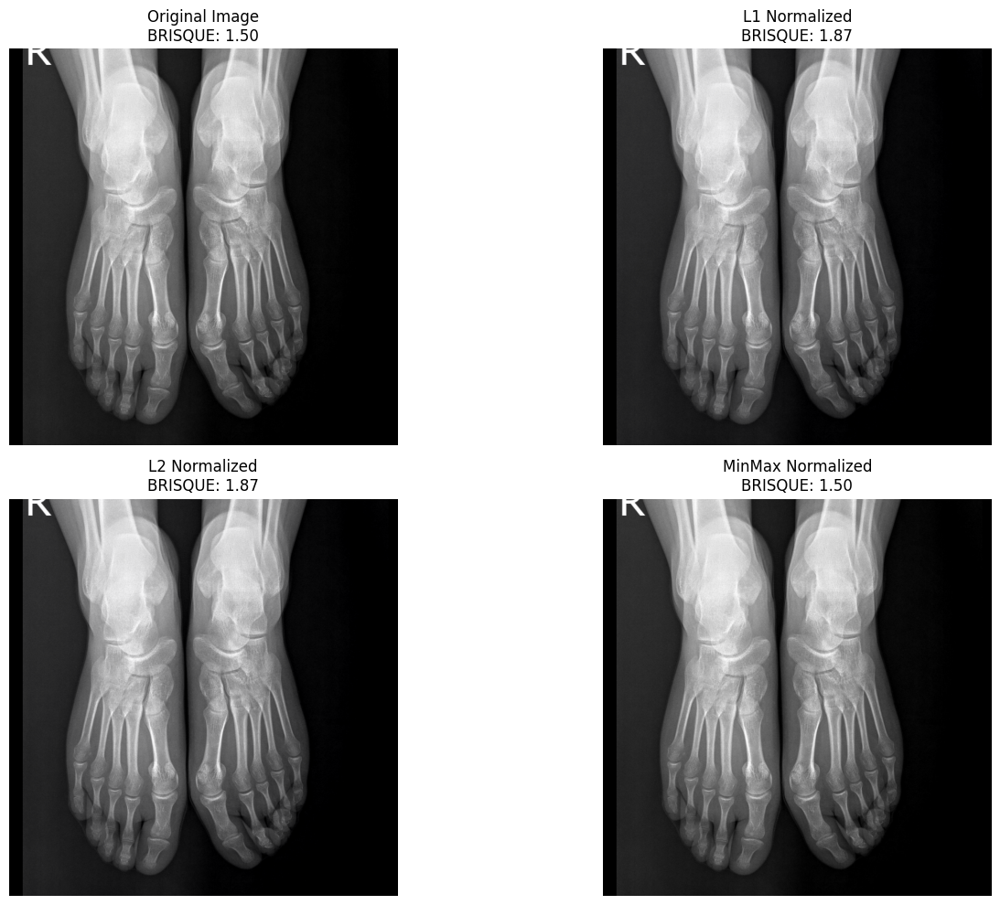

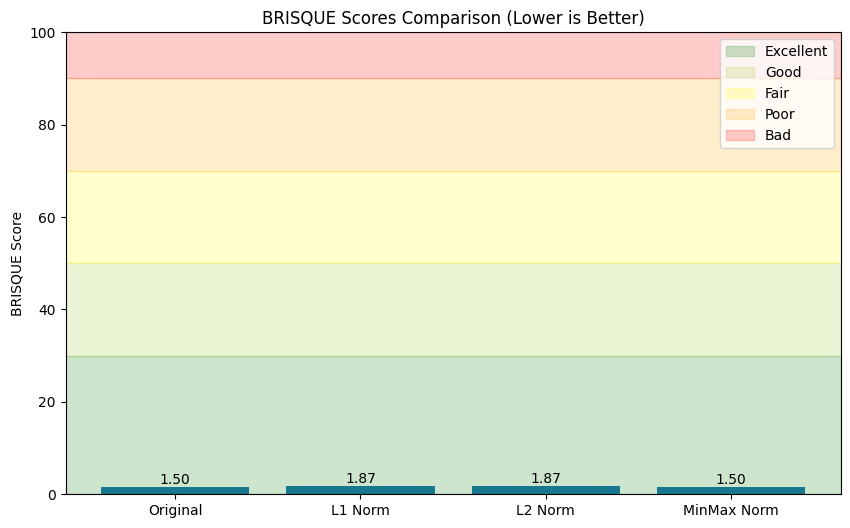


BRISQUE Scores and Quality Assessment:
Original Image: 1.50 - Excellent
L1 Normalized: 1.87 - Excellent
L2 Normalized: 1.87 - Excellent
MinMax Normalized: 1.50 - Excellent


In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from piq import brisque

# Görüntüyü oku
img = cv2.imread('both_1.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Görüntü özelliklerini yazdır
def print_image_stats(image, name):
    print(f"\n{name}:")
    for i, channel in enumerate(['R', 'G', 'B']):
        print(f"{channel} channel - Min: {image[:,:,i].min()}, "
              f"Max: {image[:,:,i].max()}, "
              f"Mean: {image[:,:,i].mean():.2f}")

# Normalizasyon öncesi değerleri kontrol et
def print_pre_norm_values(image, name):
    print(f"\nPre-normalization values for {name}:")
    for i in range(3):
        channel = image[:,:,i].astype(float)
        l1 = np.sum(np.abs(channel))
        l2 = np.sqrt(np.sum(channel**2))
        print(f"Channel {i}: L1={l1:.2f}, L2={l2:.2f}")

print("\nOriginal Image properties:")
print_image_stats(img, "Original")
print_pre_norm_values(img, "Original Image")

# L1 Normalizasyon
def l1_norm(image):
    eps = 1e-8
    image_float = image.astype(float)
    normalized = np.zeros_like(image_float)
    
    # Normalizasyon öncesi değerleri yazdır
    print("\nL1 Norm değerleri:")
    for i in range(3):
        channel = image_float[:,:,i]
        norm = np.sum(np.abs(channel)) + eps
        normalized[:,:,i] = channel / norm
        print(f"Channel {i} norm: {norm}")
    
    normalized = (normalized - normalized.min()) / (normalized.max() - normalized.min()) * 255
    return normalized.astype(np.uint8)

# L2 Normalizasyon
def l2_norm(image):
    eps = 1e-8
    image_float = image.astype(float)
    normalized = np.zeros_like(image_float)
    
    # Normalizasyon öncesi değerleri yazdır
    print("\nL2 Norm değerleri:")
    for i in range(3):
        channel = image_float[:,:,i]
        norm = np.sqrt(np.sum(channel**2)) + eps
        normalized[:,:,i] = channel / norm
        print(f"Channel {i} norm: {norm}")
    
    normalized = (normalized - normalized.min()) / (normalized.max() - normalized.min()) * 255
    return normalized.astype(np.uint8)

# MinMax Normalizasyon
def minmax_norm(image):
    image_float = image.astype(float)
    normalized = np.zeros_like(image_float)
    for i in range(3):  # RGB kanalları için
        channel = image_float[:,:,i]
        min_val = np.min(channel)
        max_val = np.max(channel)
        if max_val != min_val:
            normalized[:,:,i] = (channel - min_val) / (max_val - min_val) * 255
        else:
            normalized[:,:,i] = channel
    return normalized.astype(np.uint8)

# Görüntüleri hazırla
def prepare_for_brisque(image):
    # Görüntüyü 0-255 aralığında tut
    image = np.clip(image, 0, 255).astype(np.uint8)

    # Görüntünün değer aralığını kontrol et
    if image.max() == image.min():
        # Eğer görüntü sabit değerlere sahipse, küçük bir kontrast ekle
        image = image.astype(float)
        image += np.random.normal(0, 1, image.shape)
        image = np.clip(image, 0, 255).astype(np.uint8)

    return image

# BRISQUE skorlarını hesapla
def calculate_brisque(image):
    image = prepare_for_brisque(image)
    tensor = torch.from_numpy(image).permute(2, 0, 1).unsqueeze(0).float() / 255.
    return brisque(tensor).item()

try:
    # Normalizasyonları uygula
    l1_normalized = l1_norm(img)
    l2_normalized = l2_norm(img)
    minmax_normalized = minmax_norm(img)

    # Normalize edilmiş görüntülerin özelliklerini yazdır
    print_image_stats(l1_normalized, "L1 Normalized")
    print_image_stats(l2_normalized, "L2 Normalized")
    print_image_stats(minmax_normalized, "MinMax Normalized")

    # BRISQUE skorlarını hesapla
    brisque_original = calculate_brisque(img)
    brisque_l1 = calculate_brisque(l1_normalized)
    brisque_l2 = calculate_brisque(l2_normalized)
    brisque_minmax = calculate_brisque(minmax_normalized)

    # Görüntüleri plot olarak göster
    plt.figure(figsize=(15, 10))

    plt.subplot(2, 2, 1)
    plt.imshow(img)
    plt.title(f'Original Image\nBRISQUE: {brisque_original:.2f}')
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(l1_normalized)
    plt.title(f'L1 Normalized\nBRISQUE: {brisque_l1:.2f}')
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.imshow(l2_normalized)
    plt.title(f'L2 Normalized\nBRISQUE: {brisque_l2:.2f}')
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(minmax_normalized)
    plt.title(f'MinMax Normalized\nBRISQUE: {brisque_minmax:.2f}')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # BRISQUE skorlarını bar plot olarak göster
    plt.figure(figsize=(10, 6))
    names = ['Original', 'L1 Norm', 'L2 Norm', 'MinMax Norm']
    scores = [brisque_original, brisque_l1, brisque_l2, brisque_minmax]

    bars = plt.bar(names, scores)
    plt.title('BRISQUE Scores Comparison (Lower is Better)')
    plt.ylabel('BRISQUE Score')
    plt.ylim(0, 100)

    # Skorları bar'ların üzerine yaz
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.2f}',
                ha='center', va='bottom')

    # Kalite bölgelerini göster
    plt.axhspan(0, 30, alpha=0.2, color='green', label='Excellent')
    plt.axhspan(30, 50, alpha=0.2, color='yellowgreen', label='Good')
    plt.axhspan(50, 70, alpha=0.2, color='yellow', label='Fair')
    plt.axhspan(70, 90, alpha=0.2, color='orange', label='Poor')
    plt.axhspan(90, 100, alpha=0.2, color='red', label='Bad')
    plt.legend()

    plt.show()

    # Kalite değerlendirmesi
    def quality_assessment(score):
        if score <= 30: return "Excellent"
        elif score <= 50: return "Good"
        elif score <= 70: return "Fair"
        elif score <= 90: return "Poor"
        else: return "Bad"

    print("\nBRISQUE Scores and Quality Assessment:")
    print(f"Original Image: {brisque_original:.2f} - {quality_assessment(brisque_original)}")
    print(f"L1 Normalized: {brisque_l1:.2f} - {quality_assessment(brisque_l1)}")
    print(f"L2 Normalized: {brisque_l2:.2f} - {quality_assessment(brisque_l2)}")
    print(f"MinMax Normalized: {brisque_minmax:.2f} - {quality_assessment(brisque_minmax)}")

except Exception as e:
    print(f"Bir hata oluştu: {str(e)}")

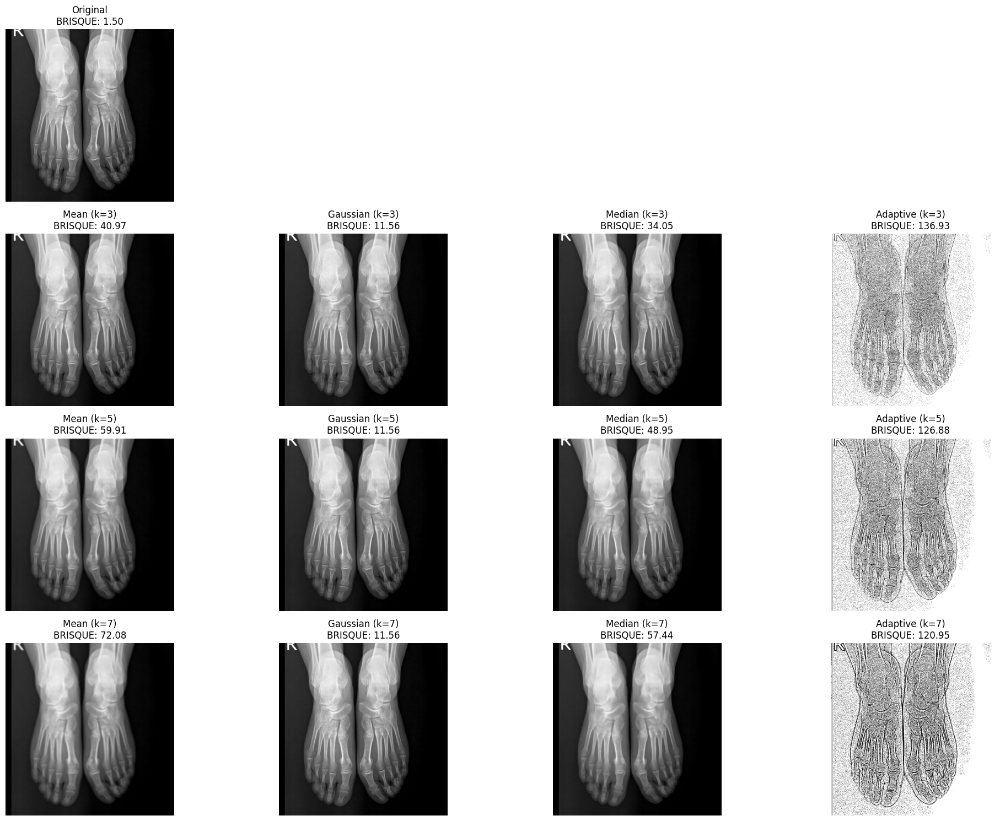

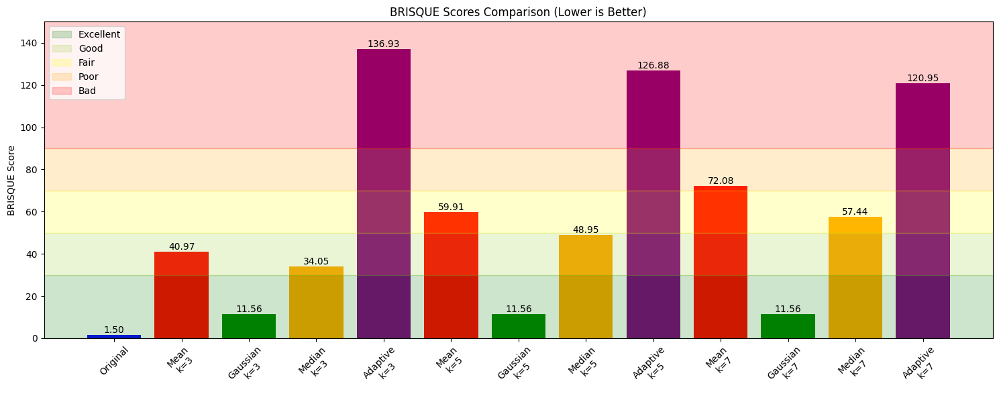


BRISQUE Scores and Quality Assessment:
Original Image: 1.50 - Excellent

Kernel Size: 3x3
Mean: 40.97 - Good
Gaussian: 11.56 - Excellent
Median: 34.05 - Good
Adaptive: 136.93 - Bad

Kernel Size: 5x5
Mean: 59.91 - Fair
Gaussian: 11.56 - Excellent
Median: 48.95 - Good
Adaptive: 126.88 - Bad

Kernel Size: 7x7
Mean: 72.08 - Poor
Gaussian: 11.56 - Excellent
Median: 57.44 - Fair
Adaptive: 120.95 - Bad

Best Results Properties:

Mean Filter Image Properties:
R channel - Min: 0, Max: 255, Mean: 72.42
G channel - Min: 0, Max: 255, Mean: 72.42
B channel - Min: 0, Max: 255, Mean: 72.42

Gaussian Filter Image Properties:
R channel - Min: 0, Max: 255, Mean: 72.42
G channel - Min: 0, Max: 255, Mean: 72.42
B channel - Min: 0, Max: 255, Mean: 72.42

Median Filter Image Properties:
R channel - Min: 0, Max: 255, Mean: 72.34
G channel - Min: 0, Max: 255, Mean: 72.34
B channel - Min: 0, Max: 255, Mean: 72.34


In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from piq import brisque

# Görüntüyü oku
img = cv2.imread('both_1.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# MinMax Normalizasyon
def minmax_norm(image):
    image_float = image.astype(float)
    normalized = np.zeros_like(image_float)
    for i in range(3):
        channel = image_float[:,:,i]
        min_val = np.min(channel)
        max_val = np.max(channel)
        if max_val != min_val:
            normalized[:,:,i] = (channel - min_val) / (max_val - min_val) * 255
        else:
            normalized[:,:,i] = channel
    return normalized.astype(np.uint8)

# Yumuşatma fonksiyonları
def minmax_mean(image, kernel_size):
    normalized = minmax_norm(image)
    return cv2.blur(normalized, (kernel_size, kernel_size))

def minmax_gaussian(image, kernel_size, sigma=0.5):
    normalized = minmax_norm(image)
    return cv2.GaussianBlur(normalized, (kernel_size, kernel_size), sigma)

def minmax_median(image, kernel_size):
    normalized = minmax_norm(image)
    return cv2.medianBlur(normalized, kernel_size)

def minmax_adaptive_median(image, kernel_size):
    normalized = minmax_norm(image)
    result = np.zeros_like(normalized)
    for i in range(3):
        result[:,:,i] = cv2.adaptiveThreshold(
            normalized[:,:,i],
            255,
            cv2.ADAPTIVE_THRESH_GAUSSIAN_C,  # Gaussian weighted
            cv2.THRESH_BINARY,
            kernel_size,
            2
        )
    return result

# BRISQUE hesaplama
def calculate_brisque(image):
    image = np.clip(image, 0, 255).astype(np.uint8)
    tensor = torch.from_numpy(image).permute(2, 0, 1).unsqueeze(0).float() / 255.
    return brisque(tensor).item()

# Kalite değerlendirmesi
def quality_assessment(score):
    if score <= 30: return "Excellent"
    elif score <= 50: return "Good"
    elif score <= 70: return "Fair"
    elif score <= 90: return "Poor"
    else: return "Bad"

try:
    # Kernel boyutları
    kernel_sizes = [3, 5, 7]

    # Sonuçları saklamak için liste
    results = []

    for k_size in kernel_sizes:
        # Farklı yumuşatma yöntemlerini uygula
        mean_filtered = minmax_mean(img, k_size)
        gaussian_filtered = minmax_gaussian(img, k_size)
        median_filtered = minmax_median(img, k_size)
        adaptive_filtered = minmax_adaptive_median(img, k_size)

        # BRISQUE skorlarını hesapla
        brisque_mean = calculate_brisque(mean_filtered)
        brisque_gaussian = calculate_brisque(gaussian_filtered)
        brisque_median = calculate_brisque(median_filtered)
        brisque_adaptive = calculate_brisque(adaptive_filtered)

        results.append({
            'kernel_size': k_size,
            'mean': {'score': brisque_mean, 'image': mean_filtered},
            'gaussian': {'score': brisque_gaussian, 'image': gaussian_filtered},
            'median': {'score': brisque_median, 'image': median_filtered},
            'adaptive': {'score': brisque_adaptive, 'image': adaptive_filtered}
        })

    # Orijinal görüntünün BRISQUE skoru
    brisque_original = calculate_brisque(img)

    # Görsel karşılaştırma
    plt.figure(figsize=(20, 15))

    # Orijinal görüntü
    plt.subplot(4, 4, 1)
    plt.imshow(img)
    plt.title(f'Original\nBRISQUE: {brisque_original:.2f}')
    plt.axis('off')

    # Filtrelenmiş görüntüler
    for idx, result in enumerate(results):
        k_size = result['kernel_size']
        row = idx + 1

        # Mean
        plt.subplot(4, 4, row*4 + 1)
        plt.imshow(result['mean']['image'])
        plt.title(f'Mean (k={k_size})\nBRISQUE: {result["mean"]["score"]:.2f}')
        plt.axis('off')

        # Gaussian
        plt.subplot(4, 4, row*4 + 2)
        plt.imshow(result['gaussian']['image'])
        plt.title(f'Gaussian (k={k_size})\nBRISQUE: {result["gaussian"]["score"]:.2f}')
        plt.axis('off')

        # Median
        plt.subplot(4, 4, row*4 + 3)
        plt.imshow(result['median']['image'])
        plt.title(f'Median (k={k_size})\nBRISQUE: {result["median"]["score"]:.2f}')
        plt.axis('off')

        # Adaptive
        plt.subplot(4, 4, row*4 + 4)
        plt.imshow(result['adaptive']['image'])
        plt.title(f'Adaptive (k={k_size})\nBRISQUE: {result["adaptive"]["score"]:.2f}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    # BRISQUE skorları karşılaştırma grafiği
    plt.figure(figsize=(15, 6))

    # Bar plot için veri hazırlığı
    labels = ['Original']
    scores = [brisque_original]
    colors = ['blue']

    for result in results:
        k_size = result['kernel_size']
        labels.extend([
            f'Mean\nk={k_size}',
            f'Gaussian\nk={k_size}',
            f'Median\nk={k_size}',
            f'Adaptive\nk={k_size}'
        ])
        scores.extend([
            result['mean']['score'],
            result['gaussian']['score'],
            result['median']['score'],
            result['adaptive']['score']
        ])
        colors.extend(['red', 'green', 'orange', 'purple'])

    bars = plt.bar(range(len(scores)), scores, color=colors)
    plt.title('BRISQUE Scores Comparison (Lower is Better)')
    plt.ylabel('BRISQUE Score')
    plt.ylim(0, 150)  # Adaptive sonuçları için üst limit artırıldı
    plt.xticks(range(len(scores)), labels, rotation=45)

    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.2f}',
                ha='center', va='bottom')

    plt.axhspan(0, 30, alpha=0.2, color='green', label='Excellent')
    plt.axhspan(30, 50, alpha=0.2, color='yellowgreen', label='Good')
    plt.axhspan(50, 70, alpha=0.2, color='yellow', label='Fair')
    plt.axhspan(70, 90, alpha=0.2, color='orange', label='Poor')
    plt.axhspan(90, 150, alpha=0.2, color='red', label='Bad')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Sonuçları yazdır
    print("\nBRISQUE Scores and Quality Assessment:")
    print(f"Original Image: {brisque_original:.2f} - {quality_assessment(brisque_original)}")

    for result in results:
        print(f"\nKernel Size: {result['kernel_size']}x{result['kernel_size']}")
        print(f"Mean: {result['mean']['score']:.2f} - {quality_assessment(result['mean']['score'])}")
        print(f"Gaussian: {result['gaussian']['score']:.2f} - {quality_assessment(result['gaussian']['score'])}")
        print(f"Median: {result['median']['score']:.2f} - {quality_assessment(result['median']['score'])}")
        print(f"Adaptive: {result['adaptive']['score']:.2f} - {quality_assessment(result['adaptive']['score'])}")

    # En iyi sonuçların özelliklerini yazdır
    def print_image_stats(image, name):
        print(f"\n{name} Image Properties:")
        for i, channel in enumerate(['R', 'G', 'B']):
            print(f"{channel} channel - Min: {image[:,:,i].min()}, "
                  f"Max: {image[:,:,i].max()}, "
                  f"Mean: {image[:,:,i].mean():.2f}")

    # En iyi sonuçları bul
    best_result = min(results, key=lambda x: min(
        x['mean']['score'],
        x['gaussian']['score'],
        x['median']['score']
    ))

    print("\nBest Results Properties:")
    print_image_stats(best_result['mean']['image'], "Mean Filter")
    print_image_stats(best_result['gaussian']['image'], "Gaussian Filter")
    print_image_stats(best_result['median']['image'], "Median Filter")

except Exception as e:
    print(f"Bir hata oluştu: {str(e)}")

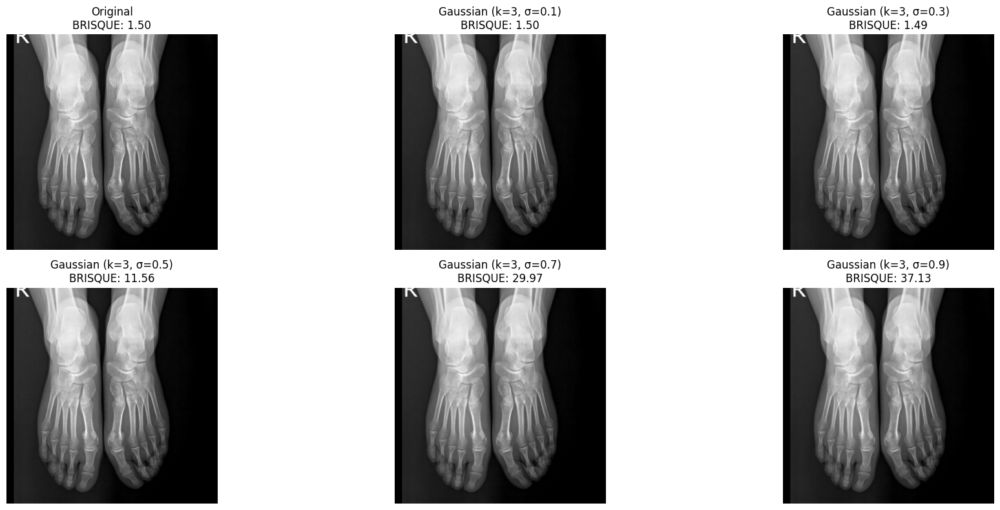

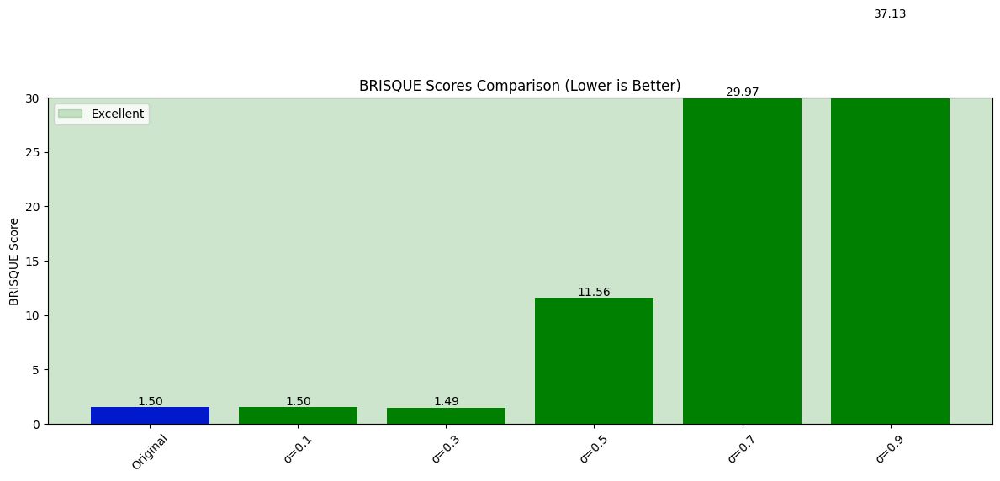


BRISQUE Scores and Quality Assessment:
Original Image: 1.50 - Excellent

Kernel Size: 3x3, Sigma: 0.1
BRISQUE Score: 1.50 - Excellent

Kernel Size: 3x3, Sigma: 0.3
BRISQUE Score: 1.49 - Excellent

Kernel Size: 3x3, Sigma: 0.5
BRISQUE Score: 11.56 - Excellent

Kernel Size: 3x3, Sigma: 0.7
BRISQUE Score: 29.97 - Excellent

Kernel Size: 3x3, Sigma: 0.9
BRISQUE Score: 37.13 - Good

Best Result Properties:
Kernel Size: 3x3
Sigma: 0.3
BRISQUE Score: 1.49

Best Gaussian Filter Image Properties:
R channel - Min: 0, Max: 255, Mean: 72.42
G channel - Min: 0, Max: 255, Mean: 72.42
B channel - Min: 0, Max: 255, Mean: 72.42


In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from piq import brisque

# Görüntüyü oku
img = cv2.imread('both_1.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# MinMax Normalizasyon
def minmax_norm(image):
    image_float = image.astype(float)
    normalized = np.zeros_like(image_float)
    for i in range(3):
        channel = image_float[:,:,i]
        min_val = np.min(channel)
        max_val = np.max(channel)
        if max_val != min_val:
            normalized[:,:,i] = (channel - min_val) / (max_val - min_val) * 255
        else:
            normalized[:,:,i] = channel
    return normalized.astype(np.uint8)

# Gaussian yumuşatma
def minmax_gaussian(image, kernel_size, sigma):
    normalized = minmax_norm(image)
    return cv2.GaussianBlur(normalized, (kernel_size, kernel_size), sigma)

# BRISQUE hesaplama
def calculate_brisque(image):
    image = np.clip(image, 0, 255).astype(np.uint8)
    tensor = torch.from_numpy(image).permute(2, 0, 1).unsqueeze(0).float() / 255.
    return brisque(tensor).item()

# Kalite değerlendirmesi
def quality_assessment(score):
    if score <= 30: return "Excellent"
    elif score <= 50: return "Good"
    elif score <= 70: return "Fair"
    elif score <= 90: return "Poor"
    else: return "Bad"

try:
    # Test parametreleri
    kernel_sizes = [3]  # Sadece 3x3 kernel
    sigma_values = [0.1, 0.3, 0.5, 0.7, 0.9]  # Daha hassas sigma değerleri

    results = []

    for k_size in kernel_sizes:
        for sigma in sigma_values:
            filtered = minmax_gaussian(img, k_size, sigma)
            brisque_score = calculate_brisque(filtered)

            results.append({
                'kernel_size': k_size,
                'sigma': sigma,
                'score': brisque_score,
                'image': filtered
            })

    # Orijinal görüntünün BRISQUE skoru
    brisque_original = calculate_brisque(img)

    # Görsel karşılaştırma
    plt.figure(figsize=(20, 8))

    # Orijinal görüntü
    plt.subplot(2, 3, 1)
    plt.imshow(img)
    plt.title(f'Original\nBRISQUE: {brisque_original:.2f}')
    plt.axis('off')

    # Filtrelenmiş görüntüler
    for idx, result in enumerate(results):
        plt.subplot(2, 3, idx + 2)
        plt.imshow(result['image'])
        plt.title(f'Gaussian (k={result["kernel_size"]}, σ={result["sigma"]:.1f})\n'
                 f'BRISQUE: {result["score"]:.2f}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    # BRISQUE skorları karşılaştırma grafiği
    plt.figure(figsize=(12, 6))

    labels = ['Original'] + [f'σ={r["sigma"]:.1f}' for r in results]
    scores = [brisque_original] + [r['score'] for r in results]
    colors = ['blue'] + ['green'] * len(results)

    bars = plt.bar(range(len(scores)), scores, color=colors)
    plt.title('BRISQUE Scores Comparison (Lower is Better)')
    plt.ylabel('BRISQUE Score')
    plt.ylim(0, 30)  # Excellent bölgesine odaklan
    plt.xticks(range(len(scores)), labels, rotation=45)

    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.2f}',
                ha='center', va='bottom')

    plt.axhspan(0, 30, alpha=0.2, color='green', label='Excellent')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Sonuçları yazdır
    print("\nBRISQUE Scores and Quality Assessment:")
    print(f"Original Image: {brisque_original:.2f} - {quality_assessment(brisque_original)}")

    for result in results:
        print(f"\nKernel Size: {result['kernel_size']}x{result['kernel_size']}, "
              f"Sigma: {result['sigma']:.1f}")
        print(f"BRISQUE Score: {result['score']:.2f} - "
              f"{quality_assessment(result['score'])}")

    # En iyi sonucun özelliklerini yazdır
    best_result = min(results, key=lambda x: x['score'])

    def print_image_stats(image, name):
        print(f"\n{name} Image Properties:")
        for i, channel in enumerate(['R', 'G', 'B']):
            print(f"{channel} channel - Min: {image[:,:,i].min()}, "
                  f"Max: {image[:,:,i].max()}, "
                  f"Mean: {image[:,:,i].mean():.2f}")

    print("\nBest Result Properties:")
    print(f"Kernel Size: {best_result['kernel_size']}x{best_result['kernel_size']}")
    print(f"Sigma: {best_result['sigma']:.1f}")
    print(f"BRISQUE Score: {best_result['score']:.2f}")
    print_image_stats(best_result['image'], "Best Gaussian Filter")

except Exception as e:
    print(f"Bir hata oluştu: {str(e)}")


Görüntü İşleme Sonuçları:
------------------------------------------------------------------------------------------
Görüntü           Pipeline1            Pipeline2            Pipeline3
                (L1+Med+Hist)      (MinMax+Mean+Gamma)   (L2+Gauss+Cont)
------------------------------------------------------------------------------------------

İşleniyor: both_1.png


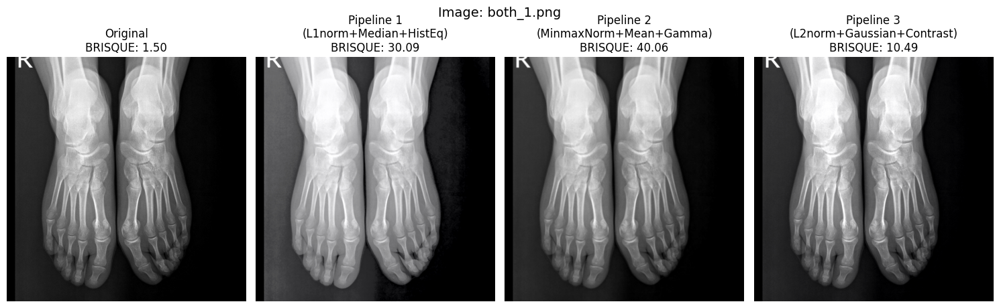

BRISQUE Skorları:      30.09                40.06                10.49

İşleniyor: both_2.png


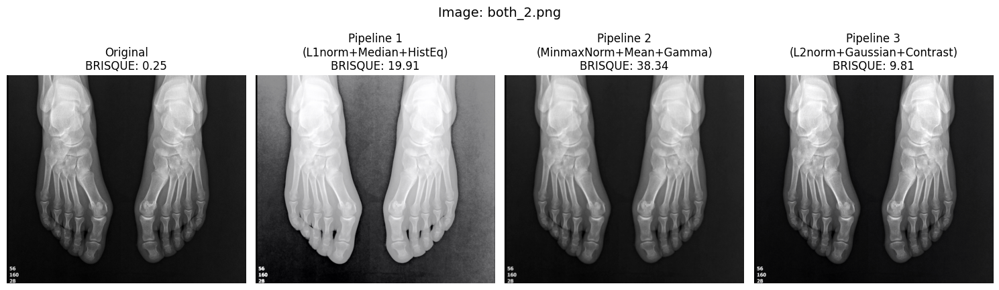

BRISQUE Skorları:      19.91                38.34                 9.81

İşleniyor: both_3.png


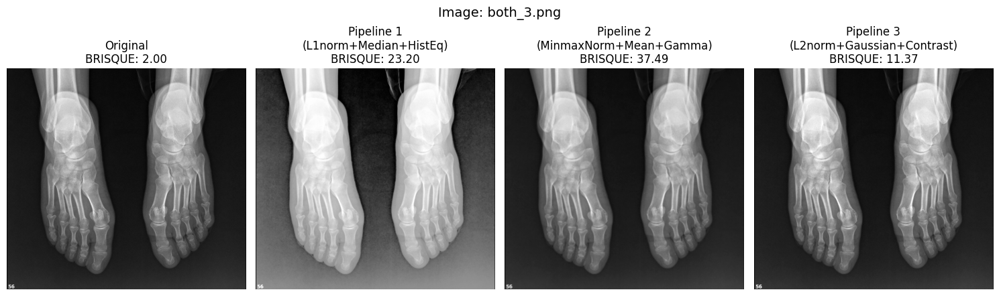

BRISQUE Skorları:      23.20                37.49                11.37

Özet:
------------------------------------------------------------------------------------------
both_1.png           30.09                40.06                10.49
both_2.png           19.91                38.34                 9.81
both_3.png           23.20                37.49                11.37

Sonuçlar:
En iyi pipeline: Pipeline 3
Ortalama BRISQUE skorları:
Pipeline 1: 24.40
Pipeline 2: 38.63
Pipeline 3: 10.56


In [22]:
import cv2
import numpy as np
import torch
from piq import brisque
import matplotlib.pyplot as plt

def calculate_brisque(image):
    """BRISQUE skorunu hesapla"""
    image = np.clip(image, 0, 255).astype(np.uint8)
    tensor = torch.from_numpy(image).permute(2, 0, 1).unsqueeze(0).float() / 255.
    return brisque(tensor).item()

def l1_norm(image):
    """L1 normalizasyon"""
    img_float = image.astype(float)
    normalized = np.zeros_like(img_float)
    for i in range(3):
        channel = img_float[:,:,i]
        norm = np.sum(np.abs(channel)) + 1e-8
        normalized[:,:,i] = channel / norm
    normalized = (normalized - normalized.min()) / (normalized.max() - normalized.min()) * 255
    return normalized.astype(np.uint8)

def l2_norm(image):
    """L2 normalizasyon"""
    img_float = image.astype(float)
    normalized = np.zeros_like(img_float)
    for i in range(3):
        channel = img_float[:,:,i]
        norm = np.sqrt(np.sum(channel**2)) + 1e-8
        normalized[:,:,i] = channel / norm
    normalized = (normalized - normalized.min()) / (normalized.max() - normalized.min()) * 255
    return normalized.astype(np.uint8)

def minmax_norm(image):
    """MinMax normalizasyon"""
    img_float = image.astype(float)
    normalized = np.zeros_like(img_float)
    for i in range(3):
        channel = img_float[:,:,i]
        normalized[:,:,i] = (channel - channel.min()) / (channel.max() - channel.min()) * 255
    return normalized.astype(np.uint8)

def apply_hist_eq(image):
    """Histogram eşitleme"""
    ycrcb = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    ycrcb[:,:,0] = cv2.equalizeHist(ycrcb[:,:,0])
    return cv2.cvtColor(ycrcb, cv2.COLOR_YCrCb2RGB)

def adjust_gamma(image, gamma=1.0):
    """Gamma düzeltme"""
    inv_gamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in np.arange(0, 256)]).astype(np.uint8)
    return cv2.LUT(image, table)

def pipeline1(image):
    """Pipeline 1: L1norm + Median + HistEq"""
    norm = l1_norm(image)
    median = cv2.medianBlur(norm, 3)
    final = apply_hist_eq(median)
    return final

def pipeline2(image):
    """Pipeline 2: MinmaxNorm + Mean + Gamma"""
    norm = minmax_norm(image)
    mean = cv2.blur(norm, (3,3))
    final = adjust_gamma(mean, gamma=1.1)
    return final

def pipeline3(image):
    """Pipeline 3: L2norm + Gaussian + Contrast"""
    norm = l2_norm(image)
    gaussian = cv2.GaussianBlur(norm, (3,3), 0.5)
    final = cv2.convertScaleAbs(gaussian, alpha=1.1, beta=0)
    return final

def process_and_display(image_path):
    try:
        # Görüntüyü oku
        img = cv2.imread(image_path)
        if img is None:
            raise ValueError(f"Görüntü okunamadı: {image_path}")
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Pipeline'ları uygula
        result1 = pipeline1(img)
        result2 = pipeline2(img)
        result3 = pipeline3(img)

        # BRISQUE skorlarını hesapla
        score1 = calculate_brisque(result1)
        score2 = calculate_brisque(result2)
        score3 = calculate_brisque(result3)

        # Görselleştirme
        plt.figure(figsize=(15, 5))
        plt.suptitle(f'Image: {image_path}', fontsize=14)
        
        plt.subplot(141)
        plt.imshow(img)
        plt.title(f'Original\nBRISQUE: {calculate_brisque(img):.2f}')
        plt.axis('off')
        
        plt.subplot(142)
        plt.imshow(result1)
        plt.title(f'Pipeline 1\n(L1norm+Median+HistEq)\nBRISQUE: {score1:.2f}')
        plt.axis('off')
        
        plt.subplot(143)
        plt.imshow(result2)
        plt.title(f'Pipeline 2\n(MinmaxNorm+Mean+Gamma)\nBRISQUE: {score2:.2f}')
        plt.axis('off')
        
        plt.subplot(144)
        plt.imshow(result3)
        plt.title(f'Pipeline 3\n(L2norm+Gaussian+Contrast)\nBRISQUE: {score3:.2f}')
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()

        return score1, score2, score3

    except Exception as e:
        print(f"Hata: {str(e)}")
        return None, None, None

def main():
    """Ana fonksiyon"""
    image_paths = ['both_1.png', 'both_2.png', 'both_3.png']

    print("\nGörüntü İşleme Sonuçları:")
    print("-" * 90)
    print("Görüntü           Pipeline1            Pipeline2            Pipeline3")
    print("                (L1+Med+Hist)      (MinMax+Mean+Gamma)   (L2+Gauss+Cont)")
    print("-" * 90)

    results = []
    for img_path in image_paths:
        print(f"\nİşleniyor: {img_path}")
        score1, score2, score3 = process_and_display(img_path)
        if score1 is not None:
            print(f"BRISQUE Skorları: {score1:>10.2f} {score2:>20.2f} {score3:>20.2f}")
            results.append((img_path, score1, score2, score3))

    if results:
        print("\nÖzet:")
        print("-" * 90)
        for img_path, s1, s2, s3 in results:
            print(f"{img_path:<15} {s1:>10.2f} {s2:>20.2f} {s3:>20.2f}")

        avg_scores = np.mean([(s1, s2, s3) for _, s1, s2, s3 in results], axis=0)
        best_pipeline = np.argmin(avg_scores) + 1
        print("\nSonuçlar:")
        print(f"En iyi pipeline: Pipeline {best_pipeline}")
        print(f"Ortalama BRISQUE skorları:")
        print(f"Pipeline 1: {avg_scores[0]:.2f}")
        print(f"Pipeline 2: {avg_scores[1]:.2f}")
        print(f"Pipeline 3: {avg_scores[2]:.2f}")

if __name__ == "__main__":
    main()

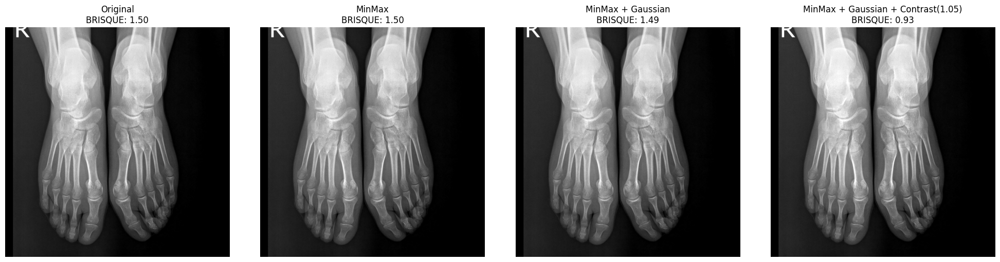


BRISQUE Scores for Each Step:
--------------------------------------------------
Original: 1.50
MinMax: 1.50
MinMax + Gaussian: 1.49
MinMax + Gaussian + Contrast(1.05): 0.93

Original Image Properties:
R channel - Min: 0, Max: 255, Mean: 72.42, Std: 72.99
G channel - Min: 0, Max: 255, Mean: 72.42, Std: 72.99
B channel - Min: 0, Max: 255, Mean: 72.42, Std: 72.99

MinMax Image Properties:
R channel - Min: 0, Max: 255, Mean: 72.42, Std: 72.99
G channel - Min: 0, Max: 255, Mean: 72.42, Std: 72.99
B channel - Min: 0, Max: 255, Mean: 72.42, Std: 72.99

MinMax + Gaussian Image Properties:
R channel - Min: 0, Max: 255, Mean: 72.42, Std: 72.99
G channel - Min: 0, Max: 255, Mean: 72.42, Std: 72.99
B channel - Min: 0, Max: 255, Mean: 72.42, Std: 72.99

MinMax + Gaussian + Contrast(1.05) Image Properties:
R channel - Min: 0, Max: 255, Mean: 75.98, Std: 76.62
G channel - Min: 0, Max: 255, Mean: 75.98, Std: 76.62
B channel - Min: 0, Max: 255, Mean: 75.98, Std: 76.62

Improvement Rates:
------------

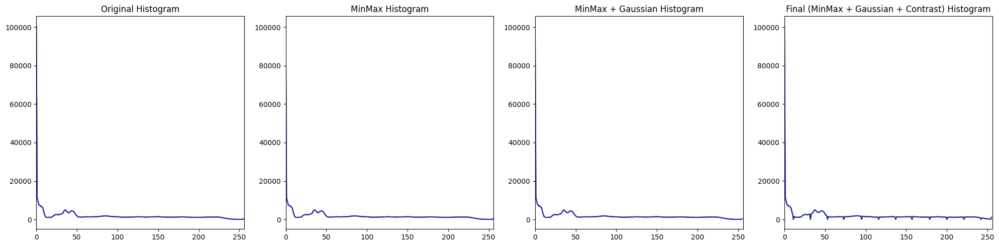

True

In [11]:
import cv2
import numpy as np
import torch
from piq import brisque
import matplotlib.pyplot as plt

def minmax_norm(image):
    """MinMax normalizasyon"""
    image_float = image.astype(float)
    normalized = np.zeros_like(image_float)
    for i in range(3):
        channel = image_float[:,:,i]
        min_val = np.min(channel)
        max_val = np.max(channel)
        if max_val != min_val:
            normalized[:,:,i] = (channel - min_val) / (max_val - min_val) * 255
        else:
            normalized[:,:,i] = channel
    return normalized.astype(np.uint8)

def calculate_brisque(image):
    """BRISQUE kalite skoru hesaplama"""
    image = np.clip(image, 0, 255).astype(np.uint8)
    tensor = torch.from_numpy(image).permute(2, 0, 1).unsqueeze(0).float() / 255.
    return brisque(tensor).item()

def print_image_stats(image, name):
    """Görüntü istatistiklerini yazdır"""
    print(f"\n{name} Image Properties:")
    for i, channel in enumerate(['R', 'G', 'B']):
        channel_data = image[:,:,i]
        print(f"{channel} channel - Min: {channel_data.min()}, "
              f"Max: {channel_data.max()}, "
              f"Mean: {channel_data.mean():.2f}, "
              f"Std: {channel_data.std():.2f}")

# Görüntüyü oku
img = cv2.imread('both_1.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Her adımı ayrı ayrı uygula ve sonuçları sakla
results = {
    'original': {
        'image': img,
        'score': calculate_brisque(img)
    },
    'minmax': {
        'image': minmax_norm(img),
        'score': calculate_brisque(minmax_norm(img))
    }
}

# Gaussian Blur ekle
results['gaussian'] = {
    'image': cv2.GaussianBlur(results['minmax']['image'], (3,3), 0.3),
    'score': calculate_brisque(cv2.GaussianBlur(results['minmax']['image'], (3,3), 0.3))
}

# Contrast ayarı ekle
results['contrast'] = {
    'image': cv2.convertScaleAbs(results['gaussian']['image'], alpha=1.05, beta=0),
    'score': calculate_brisque(cv2.convertScaleAbs(results['gaussian']['image'], alpha=1.05, beta=0))
}

# Görselleştirme
plt.figure(figsize=(20, 5))

titles = {
    'original': 'Original',
    'minmax': 'MinMax',
    'gaussian': 'MinMax + Gaussian',
    'contrast': 'MinMax + Gaussian + Contrast(1.05)'
}

for i, (key, value) in enumerate(results.items()):
    plt.subplot(1, 4, i+1)
    plt.imshow(value['image'])
    plt.title(f"{titles[key]}\nBRISQUE: {value['score']:.2f}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# Sonuçları yazdır
print("\nBRISQUE Scores for Each Step:")
print("-" * 50)
for key, value in results.items():
    print(f"{titles[key]}: {value['score']:.2f}")

# Her adımın görüntü özelliklerini yazdır
for key, value in results.items():
    print_image_stats(value['image'], titles[key])

# İyileştirme oranlarını hesapla ve yazdır
print("\nImprovement Rates:")
print("-" * 50)
base_score = results['original']['score']
for key, value in list(results.items())[1:]:
    improvement = ((base_score - value['score']) / base_score) * 100
    print(f"{titles[key]}: {improvement:+.2f}% improvement from original")

# Histogram karşılaştırması
plt.figure(figsize=(20, 5))
colors = ['r', 'g', 'b']
titles = {
    'original': 'Original Histogram',
    'minmax': 'MinMax Histogram',
    'gaussian': 'MinMax + Gaussian Histogram',
    'contrast': 'Final (MinMax + Gaussian + Contrast) Histogram'
}

for i, (key, value) in enumerate(results.items()):
    plt.subplot(1, 4, i+1)
    for j, color in enumerate(colors):
        hist = cv2.calcHist([value['image']], [j], None, [256], [0, 256])
        plt.plot(hist, color=color, alpha=0.7)
    plt.title(titles[key])
    plt.xlim([0, 256])
plt.tight_layout()
plt.show()

# Son görüntüyü kaydet
final_image = cv2.cvtColor(results['contrast']['image'], cv2.COLOR_RGB2BGR)
cv2.imwrite('enhanced_final.png', final_image)


Original Properties:
Min: 0
Max: 255
Mean: 72.42
Std: 72.99

Enhanced_Base Properties:
Min: 0
Max: 255
Mean: 75.98
Std: 76.62
Quality Metrics:
Mean Change: +4.92%
Std Change: +4.97%

Enhanced_CLAHE Properties:
Min: 0
Max: 255
Mean: 79.07
Std: 72.82
Quality Metrics:
Mean Change: +9.18%
Std Change: -0.24%

Enhanced_Threshold Properties:
Min: 0
Max: 255
Mean: 46.36
Std: 83.73
Quality Metrics:
Mean Change: -35.98%
Std Change: +14.71%

Enhanced_CLAHE_Threshold Properties:
Min: 0
Max: 255
Mean: 46.38
Std: 82.19
Quality Metrics:
Mean Change: -35.95%
Std Change: +12.61%


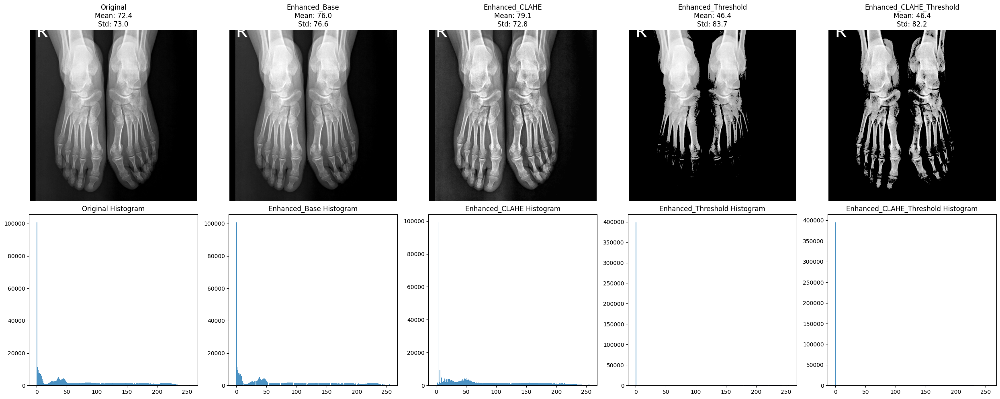

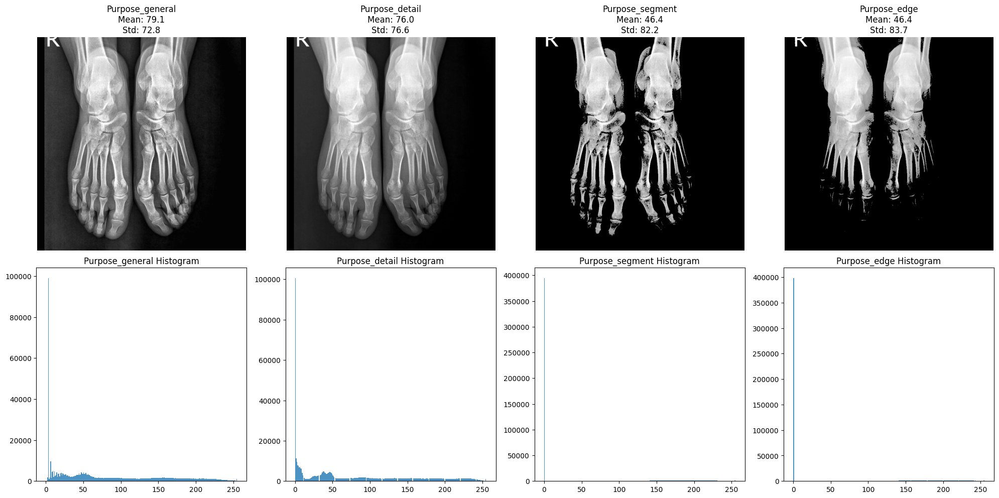


Processing Pipeline Summary:
--------------------------------------------------
1. MinMax Normalization
2. Gaussian Blur (3x3, σ=0.3)
3. Contrast Enhancement (α=1.05)
4. CLAHE (clipLimit=2.0, tileGridSize=8x8)
5. Threshold (value=140, THRESH_TOZERO)

Recommended Usage:
--------------------------------------------------
- General Purpose: Enhanced + CLAHE
- Detail Preservation: Enhanced Base
- Segmentation: Enhanced + CLAHE + Threshold
- Edge Detection: Enhanced + Threshold


In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import scipy.ndimage as ndi
from skimage import filters, feature, morphology

def minmax_norm(image):
    """MinMax normalizasyon"""
    image_float = image.astype(float)
    min_val = np.min(image_float)
    max_val = np.max(image_float)
    if max_val != min_val:
        normalized = (image_float - min_val) / (max_val - min_val) * 255
    else:
        normalized = image_float
    return normalized.astype(np.uint8)

def optimal_image_enhancement(image, enhancement_type='clahe', threshold_value=140):
    """
    Optimize edilmiş görüntü iyileştirme pipeline'ı

    Args:
        image: Giriş görüntüsü
        enhancement_type: 'base', 'clahe', 'threshold', 'threshold_clahe'
        threshold_value: Threshold değeri
    Returns:
        enhanced_image: İyileştirilmiş görüntü
    """
    # 1. Base enhancement
    normalized = minmax_norm(image)
    gaussian = cv2.GaussianBlur(normalized, (3,3), 0.3)
    enhanced_base = cv2.convertScaleAbs(gaussian, alpha=1.05, beta=0)

    if enhancement_type == 'base':
        return enhanced_base

    # 2. CLAHE enhancement
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_clahe = clahe.apply(enhanced_base)

    if enhancement_type == 'clahe':
        return enhanced_clahe

    # 3. Threshold operations
    if enhancement_type == 'threshold':
        _, threshold = cv2.threshold(enhanced_base, threshold_value, 255, cv2.THRESH_TOZERO)
        return threshold

    if enhancement_type == 'threshold_clahe':
        _, threshold = cv2.threshold(enhanced_clahe, threshold_value, 255, cv2.THRESH_TOZERO)
        return threshold

    raise ValueError("Invalid enhancement_type")

def process_image(image, purpose='general'):
    """
    Amaca özel görüntü işleme

    Args:
        image: Giriş görüntüsü
        purpose: 'general', 'detail', 'segment', 'edge'
    Returns:
        processed_image: İşlenmiş görüntü
    """
    if purpose == 'general':
        # Genel amaçlı iyileştirme
        return optimal_image_enhancement(image, 'clahe')

    elif purpose == 'detail':
        # Detay koruma
        return optimal_image_enhancement(image, 'base')

    elif purpose == 'segment':
        # Bölütleme
        return optimal_image_enhancement(image, 'threshold_clahe')

    elif purpose == 'edge':
        # Kenar tespiti
        return optimal_image_enhancement(image, 'threshold')

    raise ValueError("Invalid purpose")

def quality_check(original, processed):
    """
    İşlem kalitesini kontrol et
    """
    mean_change = ((processed.mean() - original.mean()) / original.mean()) * 100
    std_change = ((processed.std() - original.std()) / original.std()) * 100

    print(f"Quality Metrics:")
    print(f"Mean Change: {mean_change:+.2f}%")
    print(f"Std Change: {std_change:+.2f}%")

    return abs(mean_change) < 40 and abs(std_change) < 20

def analyze_image(image, name="Image"):
    """Görüntü istatistiklerini analiz et"""
    print(f"\n{name} Properties:")
    print(f"Min: {image.min()}")
    print(f"Max: {image.max()}")
    print(f"Mean: {image.mean():.2f}")
    print(f"Std: {image.std():.2f}")

def visualize_results(images_dict):
    """
    Sonuçları görselleştir

    Args:
        images_dict: {name: image} formatında görüntü sözlüğü
    """
    n_images = len(images_dict)
    fig_width = 5 * n_images
    plt.figure(figsize=(fig_width, 10))

    # Görüntüleri göster
    for i, (name, img) in enumerate(images_dict.items(), 1):
        plt.subplot(2, n_images, i)
        plt.imshow(img, cmap='gray')
        plt.title(f'{name}\nMean: {img.mean():.1f}\nStd: {img.std():.1f}')
        plt.axis('off')

        # Histogram
        plt.subplot(2, n_images, i + n_images)
        plt.hist(img.ravel(), bins=256, alpha=0.8)
        plt.title(f'{name} Histogram')

    plt.tight_layout()
    plt.show()

def save_results(images_dict, prefix=""):
    """Sonuçları kaydet"""
    for name, image in images_dict.items():
        filename = f"{prefix}_{name}.png" if prefix else f"{name}.png"
        cv2.imwrite(filename, image)

def main():
    # Görüntüyü oku
    image = cv2.imread('both_1.png', cv2.IMREAD_GRAYSCALE)

    # Farklı işlemleri uygula
    results = {
        'Original': image,
        'Enhanced_Base': optimal_image_enhancement(image, 'base'),
        'Enhanced_CLAHE': optimal_image_enhancement(image, 'clahe'),
        'Enhanced_Threshold': optimal_image_enhancement(image, 'threshold'),
        'Enhanced_CLAHE_Threshold': optimal_image_enhancement(image, 'threshold_clahe')
    }

    # Her görüntüyü analiz et
    for name, img in results.items():
        analyze_image(img, name)
        if name != 'Original':
            quality_check(results['Original'], img)

    # Sonuçları görselleştir
    visualize_results(results)

    # Sonuçları kaydet
    save_results(results)

    # Farklı amaçlar için işlemler
    purposes = ['general', 'detail', 'segment', 'edge']
    purpose_results = {
        f'Purpose_{purpose}': process_image(image, purpose)
        for purpose in purposes
    }

    # Amaca özel sonuçları görselleştir
    visualize_results(purpose_results)

    # Amaca özel sonuçları kaydet
    save_results(purpose_results, prefix='purpose')

    print("\nProcessing Pipeline Summary:")
    print("-" * 50)
    print("1. MinMax Normalization")
    print("2. Gaussian Blur (3x3, σ=0.3)")
    print("3. Contrast Enhancement (α=1.05)")
    print("4. CLAHE (clipLimit=2.0, tileGridSize=8x8)")
    print("5. Threshold (value=140, THRESH_TOZERO)")

    print("\nRecommended Usage:")
    print("-" * 50)
    print("- General Purpose: Enhanced + CLAHE")
    print("- Detail Preservation: Enhanced Base")
    print("- Segmentation: Enhanced + CLAHE + Threshold")
    print("- Edge Detection: Enhanced + Threshold")

if __name__ == "__main__":
    try:
        main()
    except Exception as e:
        print(f"Error occurred: {str(e)}")

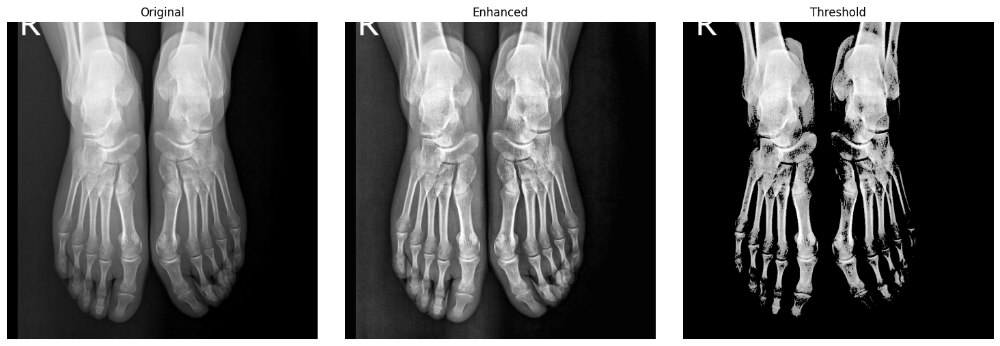

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import scipy.ndimage as ndi
from skimage import filters, feature, morphology
%matplotlib inline

def minmax_norm(image):
    """MinMax normalizasyon"""
    image_float = image.astype(float)
    min_val = np.min(image_float)
    max_val = np.max(image_float)
    if max_val != min_val:
        normalized = (image_float - min_val) / (max_val - min_val) * 255
    else:
        normalized = image_float
    return normalized.astype(np.uint8)

def optimal_image_enhancement(image):
    # 1. Base enhancement
    normalized = minmax_norm(image)
    gaussian = cv2.GaussianBlur(normalized, (3,3), 0.3)
    enhanced_base = cv2.convertScaleAbs(gaussian, alpha=1.05, beta=0)

    # 2. CLAHE enhancement
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_clahe = clahe.apply(enhanced_base)

    # 3. Threshold işlemi (THRESH_TOZERO)
    _, threshold = cv2.threshold(enhanced_clahe, 140, 255, cv2.THRESH_TOZERO)

    return enhanced_base, enhanced_clahe, threshold

# Görüntüyü oku
image = cv2.imread('both_1.png', cv2.IMREAD_GRAYSCALE)

# İyileştirme işlemi
enhanced_base, enhanced_clahe, threshold = optimal_image_enhancement(image)

# Görselleştirme
plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.imshow(image, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(132)
plt.imshow(enhanced_clahe, cmap='gray')
plt.title('Enhanced')
plt.axis('off')

plt.subplot(133)
plt.imshow(threshold, cmap='gray')
plt.title('Threshold')
plt.axis('off')

plt.tight_layout()
plt.show()

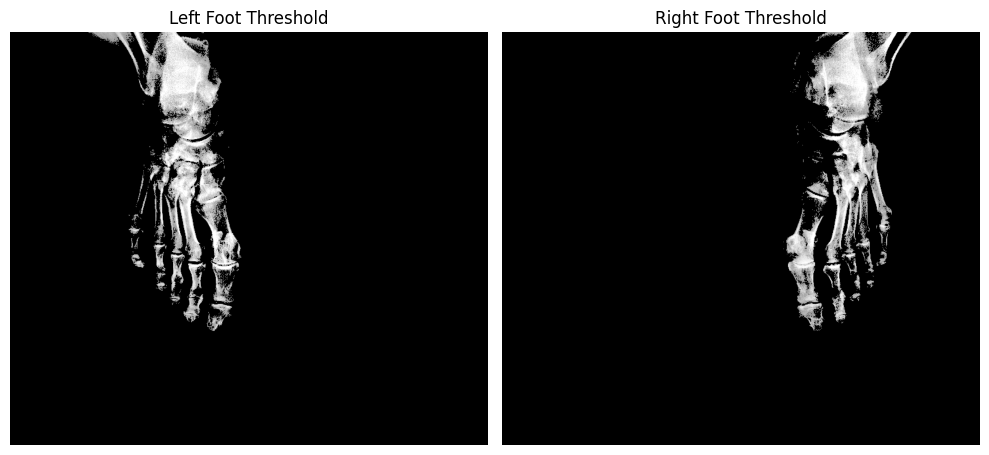

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import scipy.ndimage as ndi
from skimage import filters, feature, morphology
%matplotlib inline

def apply_clahe(image):
    """Zıtlık Dönüşümü (CLAHE)"""
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    clahe_image = clahe.apply(image)
    return clahe_image

def preprocess_image(image):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    enhanced = apply_clahe(gray)
    blurred = cv2.GaussianBlur(enhanced, (5, 5), 0)
    _, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    kernel = np.ones((5,5), np.uint8)
    closing = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)
    opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel)

    return opening, enhanced

def find_feet_contours(processed_image):
    contours, _ = cv2.findContours(processed_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:2]
    return contours

def separate_feet(image, processed, enhanced):
    contours = find_feet_contours(processed)

    if len(contours) == 2:
        mask1 = np.zeros_like(processed)
        mask2 = np.zeros_like(processed)

        cv2.drawContours(mask1, [contours[0]], -1, 255, -1)
        cv2.drawContours(mask2, [contours[1]], -1, 255, -1)

        foot1 = cv2.bitwise_and(enhanced, enhanced, mask=mask1)
        foot2 = cv2.bitwise_and(enhanced, enhanced, mask=mask2)

        M1 = cv2.moments(contours[0])
        M2 = cv2.moments(contours[1])

        if M1['m00'] != 0 and M2['m00'] != 0:
            cx1 = int(M1['m10']/M1['m00'])
            cx2 = int(M2['m10']/M2['m00'])

            if cx1 < cx2:
                left_foot = foot1
                right_foot = foot2
            else:
                left_foot = foot2
                right_foot = foot1

            return left_foot, right_foot

    height, width = enhanced.shape[:2]
    left_foot = enhanced[:, :width//2]
    right_foot = enhanced[:, width//2:]

    return left_foot, right_foot

def minmax_norm(image):
    """MinMax normalizasyon"""
    image_float = image.astype(float)
    min_val = np.min(image_float)
    max_val = np.max(image_float)
    if max_val != min_val:
        normalized = (image_float - min_val) / (max_val - min_val) * 255
    else:
        normalized = image_float
    return normalized.astype(np.uint8)

def optimal_image_enhancement(image):
    normalized = minmax_norm(image)
    gaussian = cv2.GaussianBlur(normalized, (3,3), 0.3)
    enhanced_base = cv2.convertScaleAbs(gaussian, alpha=1.05, beta=0)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_clahe = clahe.apply(enhanced_base)

    _, threshold = cv2.threshold(enhanced_clahe, 140, 255, cv2.THRESH_TOZERO)

    return threshold

# Ana işlem
# 1. Görüntüyü oku
image = cv2.imread('both_21.png', cv2.IMREAD_GRAYSCALE)

# 2. İlk ayırma işlemi
processed, enhanced = preprocess_image(image)
left_foot, right_foot = separate_feet(image, processed, enhanced)

# 3. Her ayak için optimal maskeleme
# Sol ve sağ ayak threshold
left_threshold = optimal_image_enhancement(left_foot)
right_threshold = optimal_image_enhancement(right_foot)

# Görselleştirme
plt.figure(figsize=(10, 5))

plt.subplot(121)
plt.imshow(left_threshold, cmap='gray')
plt.title('Left Foot Threshold')
plt.axis('off')

plt.subplot(122)
plt.imshow(right_threshold, cmap='gray')
plt.title('Right Foot Threshold')
plt.axis('off')

plt.tight_layout()
plt.show()

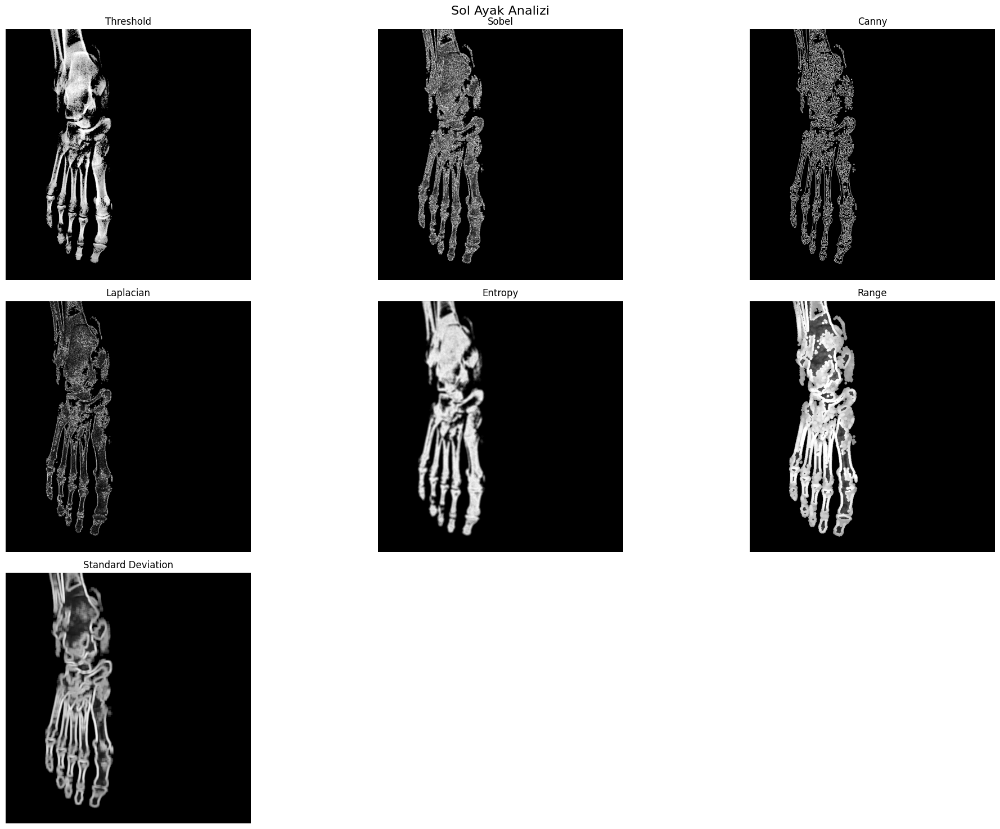

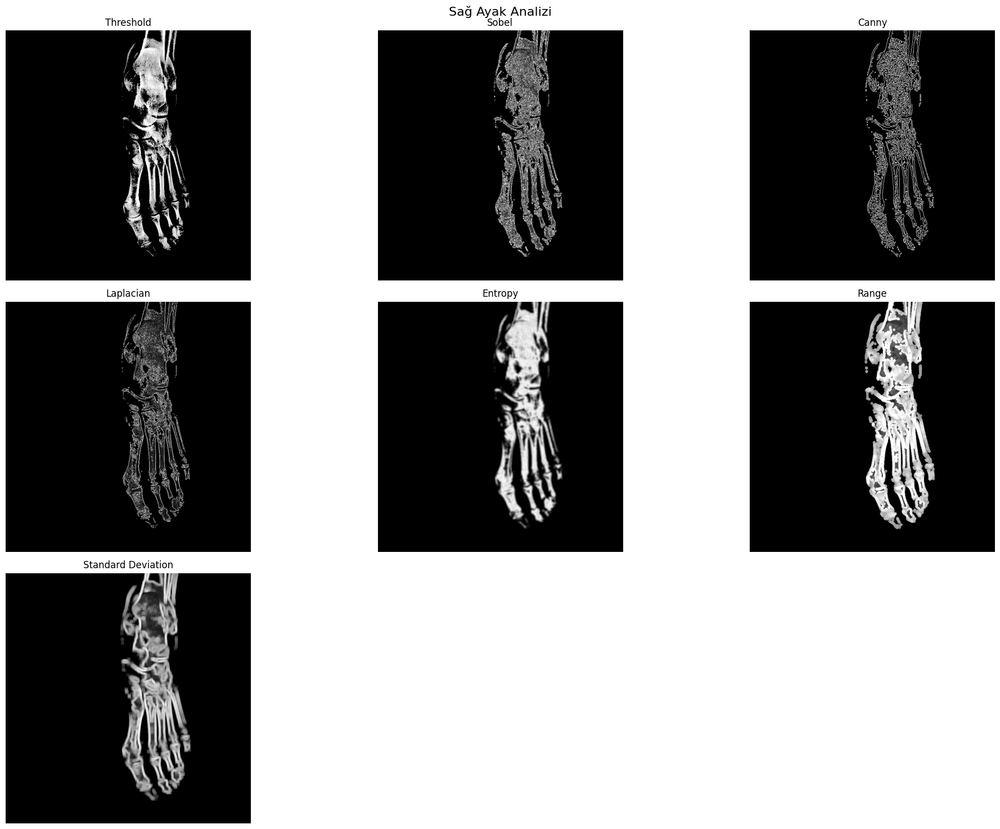


Sol Ayak İstatistikleri:
Entropy Mean: 0.56
Range Mean: 31.57
Std Mean: 10.97

Sağ Ayak İstatistikleri:
Entropy Mean: 0.47
Range Mean: 29.56
Std Mean: 10.39


In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import scipy.ndimage as ndi
from skimage import filters, feature, morphology
from skimage.util import img_as_ubyte
%matplotlib inline

def apply_clahe(image):
    """Zıtlık Dönüşümü (CLAHE)"""
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    clahe_image = clahe.apply(image)
    return clahe_image

def preprocess_image(image):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    enhanced = apply_clahe(gray)
    blurred = cv2.GaussianBlur(enhanced, (5, 5), 0)
    _, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    kernel = np.ones((5,5), np.uint8)
    closing = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)
    opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel)

    return opening, enhanced

def find_feet_contours(processed_image):
    contours, _ = cv2.findContours(processed_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:2]
    return contours

def separate_feet(image, processed, enhanced):
    contours = find_feet_contours(processed)

    if len(contours) == 2:
        mask1 = np.zeros_like(processed)
        mask2 = np.zeros_like(processed)

        cv2.drawContours(mask1, [contours[0]], -1, 255, -1)
        cv2.drawContours(mask2, [contours[1]], -1, 255, -1)

        foot1 = cv2.bitwise_and(enhanced, enhanced, mask=mask1)
        foot2 = cv2.bitwise_and(enhanced, enhanced, mask=mask2)

        M1 = cv2.moments(contours[0])
        M2 = cv2.moments(contours[1])

        if M1['m00'] != 0 and M2['m00'] != 0:
            cx1 = int(M1['m10']/M1['m00'])
            cx2 = int(M2['m10']/M2['m00'])

            if cx1 < cx2:
                left_foot = foot1
                right_foot = foot2
            else:
                left_foot = foot2
                right_foot = foot1

            return left_foot, right_foot

    height, width = enhanced.shape[:2]
    left_foot = enhanced[:, :width//2]
    right_foot = enhanced[:, width//2:]

    return left_foot, right_foot

def minmax_norm(image):
    """MinMax normalizasyon"""
    image_float = image.astype(float)
    min_val = np.min(image_float)
    max_val = np.max(image_float)
    if max_val != min_val:
        normalized = (image_float - min_val) / (max_val - min_val) * 255
    else:
        normalized = image_float
    return normalized.astype(np.uint8)

def optimal_image_enhancement(image):
    normalized = minmax_norm(image)
    gaussian = cv2.GaussianBlur(normalized, (3,3), 0.3)
    enhanced_base = cv2.convertScaleAbs(gaussian, alpha=1.05, beta=0)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_clahe = clahe.apply(enhanced_base)

    _, threshold = cv2.threshold(enhanced_clahe, 140, 255, cv2.THRESH_TOZERO)

    return threshold

def apply_edge_detection(image):
    """Kenar tespit yöntemlerini uygula"""
    # Sobel
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    sobel = np.sqrt(sobelx**2 + sobely**2)
    sobel = np.uint8(sobel)

    # Canny
    canny = cv2.Canny(image, 50, 150)

    # Laplacian
    laplacian = cv2.Laplacian(image, cv2.CV_64F)
    laplacian = np.uint8(np.absolute(laplacian))

    return sobel, canny, laplacian

def calculate_statistics(image):
    """İstatistiksel özellikleri hesapla"""
    # Görüntüyü uint8'e çevir
    image_uint8 = img_as_ubyte(image)

    # Yapılandırma elemanı
    selem = morphology.disk(4)

    # Entropi
    entropy = filters.rank.entropy(image_uint8, selem)

    # Range (Yerel min-max farkı)
    local_max = filters.rank.maximum(image_uint8, selem)
    local_min = filters.rank.minimum(image_uint8, selem)
    local_range = local_max - local_min

    # Standart Sapma (manuel hesaplama)
    # Görüntüyü float32'ye çevir
    img_float = image_uint8.astype(np.float32)

    # Yerel ortalama hesapla
    mean = cv2.blur(img_float, (9,9))

    # Yerel varyans hesapla
    mean_sq = cv2.blur(img_float**2, (9,9))
    variance = mean_sq - mean**2

    # Negatif değerleri sıfırla
    variance = np.maximum(variance, 0)

    # Standart sapma hesapla
    local_std = np.sqrt(variance)

    return entropy, local_range, local_std.astype(np.uint8)

# Ana işlem
# 1. Görüntüyü oku
image = cv2.imread('both_1.png', cv2.IMREAD_GRAYSCALE)

# 2. İlk ayırma işlemi
processed, enhanced = preprocess_image(image)
left_foot, right_foot = separate_feet(image, processed, enhanced)

# 3. Her ayak için optimal maskeleme
left_threshold = optimal_image_enhancement(left_foot)
right_threshold = optimal_image_enhancement(right_foot)

# 4. Kenar tespiti ve istatistiksel özellikler
# Sol ayak için tüm işlemler
left_sobel, left_canny, left_laplacian = apply_edge_detection(left_threshold)
left_entropy, left_range, left_std = calculate_statistics(left_threshold)

# Sağ ayak için tüm işlemler
right_sobel, right_canny, right_laplacian = apply_edge_detection(right_threshold)
right_entropy, right_range, right_std = calculate_statistics(right_threshold)

# Görselleştirme
# Sol ayak sonuçları
plt.figure(figsize=(20, 15))
plt.suptitle('Sol Ayak Analizi', fontsize=16)

plt.subplot(331)
plt.imshow(left_threshold, cmap='gray')
plt.title('Threshold')
plt.axis('off')

plt.subplot(332)
plt.imshow(left_sobel, cmap='gray')
plt.title('Sobel')
plt.axis('off')

plt.subplot(333)
plt.imshow(left_canny, cmap='gray')
plt.title('Canny')
plt.axis('off')

plt.subplot(334)
plt.imshow(left_laplacian, cmap='gray')
plt.title('Laplacian')
plt.axis('off')

plt.subplot(335)
plt.imshow(left_entropy, cmap='gray')
plt.title('Entropy')
plt.axis('off')

plt.subplot(336)
plt.imshow(left_range, cmap='gray')
plt.title('Range')
plt.axis('off')

plt.subplot(337)
plt.imshow(left_std, cmap='gray')
plt.title('Standard Deviation')
plt.axis('off')

plt.tight_layout()
plt.show()

# Sağ ayak sonuçları
plt.figure(figsize=(20, 15))
plt.suptitle('Sağ Ayak Analizi', fontsize=16)

plt.subplot(331)
plt.imshow(right_threshold, cmap='gray')
plt.title('Threshold')
plt.axis('off')

plt.subplot(332)
plt.imshow(right_sobel, cmap='gray')
plt.title('Sobel')
plt.axis('off')

plt.subplot(333)
plt.imshow(right_canny, cmap='gray')
plt.title('Canny')
plt.axis('off')

plt.subplot(334)
plt.imshow(right_laplacian, cmap='gray')
plt.title('Laplacian')
plt.axis('off')

plt.subplot(335)
plt.imshow(right_entropy, cmap='gray')
plt.title('Entropy')
plt.axis('off')

plt.subplot(336)
plt.imshow(right_range, cmap='gray')
plt.title('Range')
plt.axis('off')

plt.subplot(337)
plt.imshow(right_std, cmap='gray')
plt.title('Standard Deviation')
plt.axis('off')

plt.tight_layout()
plt.show()

# İstatistiksel değerleri yazdır
print("\nSol Ayak İstatistikleri:")
print(f"Entropy Mean: {np.mean(left_entropy):.2f}")
print(f"Range Mean: {np.mean(left_range):.2f}")
print(f"Std Mean: {np.mean(left_std):.2f}")

print("\nSağ Ayak İstatistikleri:")
print(f"Entropy Mean: {np.mean(right_entropy):.2f}")
print(f"Range Mean: {np.mean(right_range):.2f}")
print(f"Std Mean: {np.mean(right_std):.2f}")

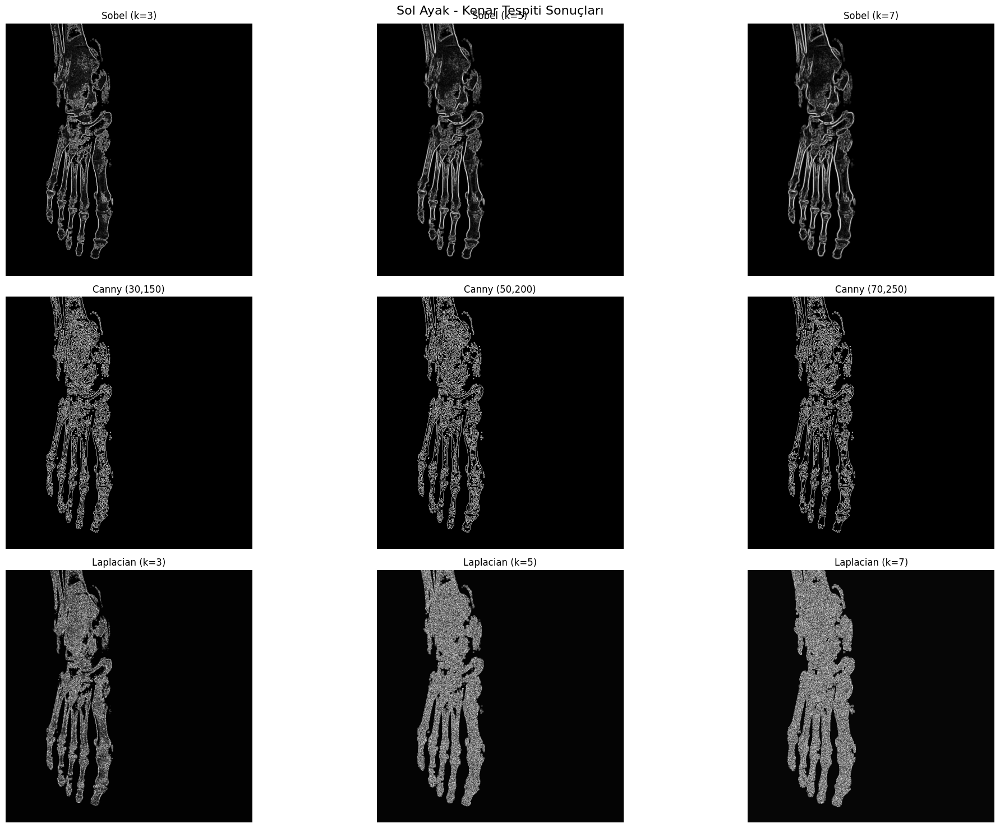

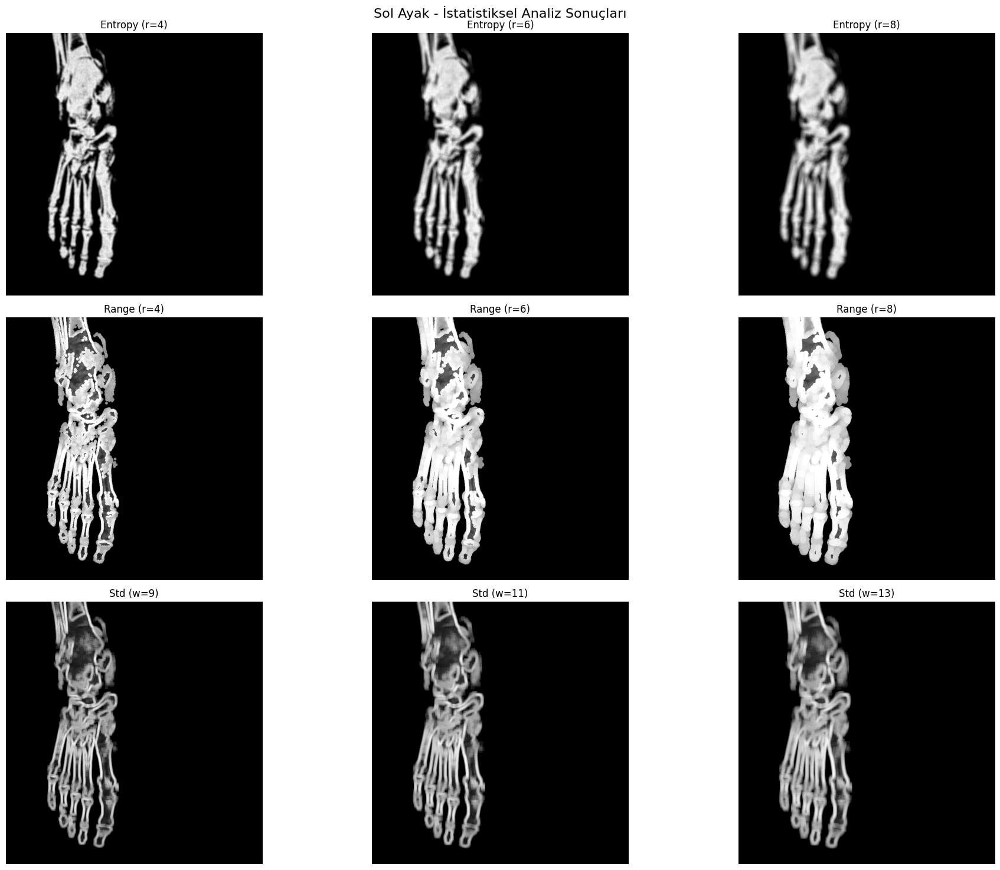

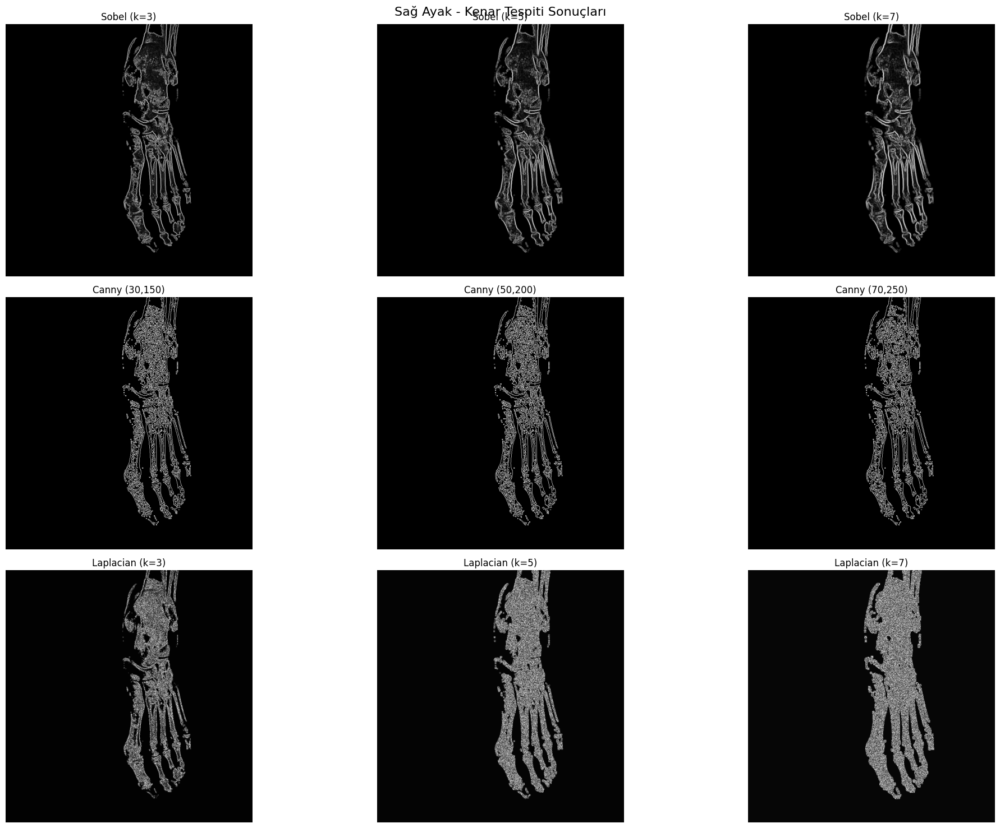

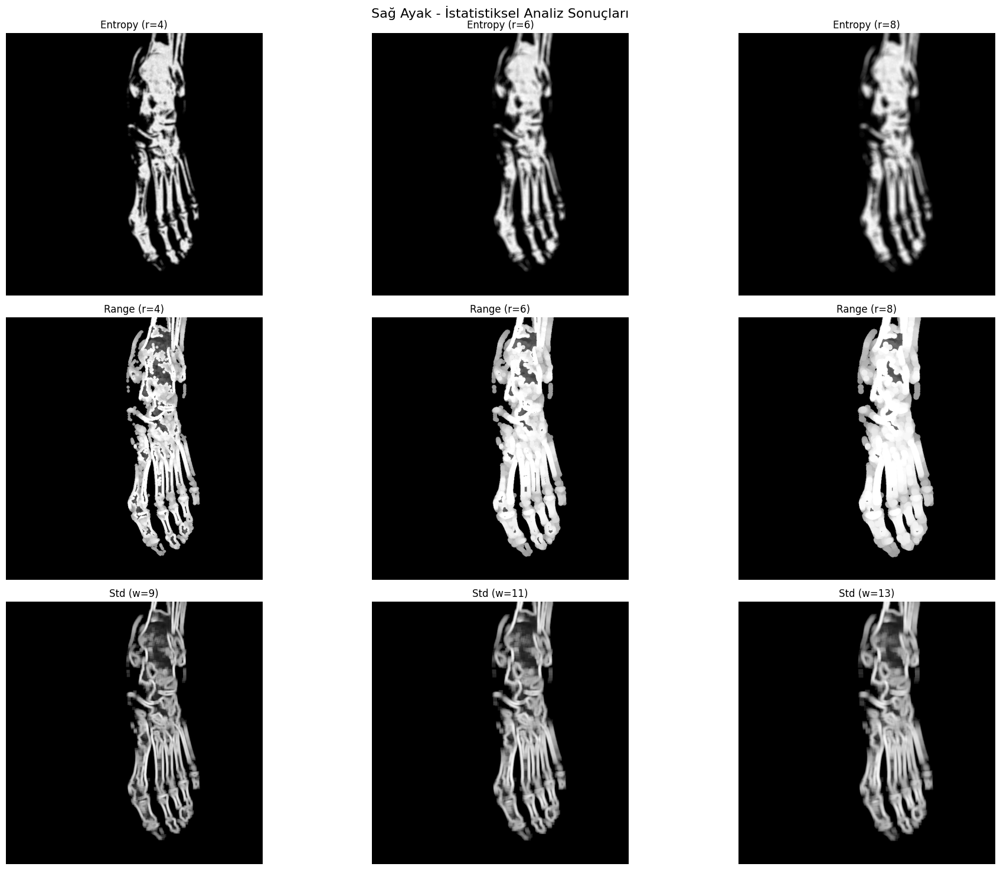


Sol Ayak İstatistikleri:
entropy_4 Mean: 0.56
entropy_6 Mean: 0.65
entropy_8 Mean: 0.71
range_4 Mean: 31.57
range_6 Mean: 39.05
range_8 Mean: 43.93
std_9 Mean: 10.97
std_11 Mean: 12.11
std_13 Mean: 13.10

Sağ Ayak İstatistikleri:
entropy_4 Mean: 0.47
entropy_6 Mean: 0.55
entropy_8 Mean: 0.60
range_4 Mean: 29.56
range_6 Mean: 36.44
range_8 Mean: 40.90
std_9 Mean: 10.39
std_11 Mean: 11.42
std_13 Mean: 12.30


In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import scipy.ndimage as ndi
from skimage import filters, feature, morphology
from skimage.util import img_as_ubyte
%matplotlib inline

def apply_clahe(image):
    """Zıtlık Dönüşümü (CLAHE)"""
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    clahe_image = clahe.apply(image)
    return clahe_image

def preprocess_image(image):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    enhanced = apply_clahe(gray)
    blurred = cv2.GaussianBlur(enhanced, (5, 5), 0)
    _, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    kernel = np.ones((5,5), np.uint8)
    closing = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)
    opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel)

    return opening, enhanced

def find_feet_contours(processed_image):
    contours, _ = cv2.findContours(processed_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:2]
    return contours

def separate_feet(image, processed, enhanced):
    contours = find_feet_contours(processed)

    if len(contours) == 2:
        mask1 = np.zeros_like(processed)
        mask2 = np.zeros_like(processed)

        cv2.drawContours(mask1, [contours[0]], -1, 255, -1)
        cv2.drawContours(mask2, [contours[1]], -1, 255, -1)

        foot1 = cv2.bitwise_and(enhanced, enhanced, mask=mask1)
        foot2 = cv2.bitwise_and(enhanced, enhanced, mask=mask2)

        M1 = cv2.moments(contours[0])
        M2 = cv2.moments(contours[1])

        if M1['m00'] != 0 and M2['m00'] != 0:
            cx1 = int(M1['m10']/M1['m00'])
            cx2 = int(M2['m10']/M2['m00'])

            if cx1 < cx2:
                left_foot = foot1
                right_foot = foot2
            else:
                left_foot = foot2
                right_foot = foot1

            return left_foot, right_foot

    height, width = enhanced.shape[:2]
    left_foot = enhanced[:, :width//2]
    right_foot = enhanced[:, width//2:]

    return left_foot, right_foot

def minmax_norm(image):
    """MinMax normalizasyon"""
    image_float = image.astype(float)
    min_val = np.min(image_float)
    max_val = np.max(image_float)
    if max_val != min_val:
        normalized = (image_float - min_val) / (max_val - min_val) * 255
    else:
        normalized = image_float
    return normalized.astype(np.uint8)

def optimal_image_enhancement(image):
    normalized = minmax_norm(image)
    gaussian = cv2.GaussianBlur(normalized, (3,3), 0.3)
    enhanced_base = cv2.convertScaleAbs(gaussian, alpha=1.05, beta=0)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_clahe = clahe.apply(enhanced_base)

    _, threshold = cv2.threshold(enhanced_clahe, 140, 255, cv2.THRESH_TOZERO)

    return threshold

def apply_edge_detection(image):
    """Kenar tespit yöntemlerini uygula - Çeşitli parametrelerle"""
    # Sobel - farklı kernel boyutları
    sobelx_3 = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    sobely_3 = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    sobel_3 = np.sqrt(sobelx_3**2 + sobely_3**2)

    sobelx_5 = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=5)
    sobely_5 = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=5)
    sobel_5 = np.sqrt(sobelx_5**2 + sobely_5**2)

    sobelx_7 = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=7)
    sobely_7 = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=7)
    sobel_7 = np.sqrt(sobelx_7**2 + sobely_7**2)

    # Normalizasyon
    sobel_3 = cv2.normalize(sobel_3, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    sobel_5 = cv2.normalize(sobel_5, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    sobel_7 = cv2.normalize(sobel_7, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Canny - farklı eşik değerleri
    canny_1 = cv2.Canny(image, 30, 150)
    canny_2 = cv2.Canny(image, 50, 200)
    canny_3 = cv2.Canny(image, 70, 250)

    # Laplacian - farklı kernel ve delta değerleri
    laplacian_3 = cv2.Laplacian(image, cv2.CV_64F, ksize=3, delta=3)
    laplacian_5 = cv2.Laplacian(image, cv2.CV_64F, ksize=5, delta=5)
    laplacian_7 = cv2.Laplacian(image, cv2.CV_64F, ksize=7, delta=7)

    laplacian_3 = np.uint8(np.absolute(laplacian_3))
    laplacian_5 = np.uint8(np.absolute(laplacian_5))
    laplacian_7 = np.uint8(np.absolute(laplacian_7))

    return {
        'sobel_3': sobel_3,
        'sobel_5': sobel_5,
        'sobel_7': sobel_7,
        'canny_1': canny_1,
        'canny_2': canny_2,
        'canny_3': canny_3,
        'laplacian_3': laplacian_3,
        'laplacian_5': laplacian_5,
        'laplacian_7': laplacian_7
    }

def calculate_statistics(image):
    """İstatistiksel özellikleri hesapla - Farklı parametrelerle"""
    image_uint8 = img_as_ubyte(image)

    # Farklı disk boyutları
    selem_4 = morphology.disk(4)
    selem_6 = morphology.disk(6)
    selem_8 = morphology.disk(8)

    # Entropi
    entropy_4 = filters.rank.entropy(image_uint8, selem_4)
    entropy_6 = filters.rank.entropy(image_uint8, selem_6)
    entropy_8 = filters.rank.entropy(image_uint8, selem_8)

    # Range
    local_range_4 = filters.rank.maximum(image_uint8, selem_4) - filters.rank.minimum(image_uint8, selem_4)
    local_range_6 = filters.rank.maximum(image_uint8, selem_6) - filters.rank.minimum(image_uint8, selem_6)
    local_range_8 = filters.rank.maximum(image_uint8, selem_8) - filters.rank.minimum(image_uint8, selem_8)

    # Standart Sapma - farklı pencere boyutları
    img_float = image_uint8.astype(np.float32)

    def calculate_std(window_size):
        mean = cv2.blur(img_float, (window_size, window_size))
        mean_sq = cv2.blur(img_float**2, (window_size, window_size))
        variance = mean_sq - mean**2
        variance = np.maximum(variance, 0)
        return np.sqrt(variance).astype(np.uint8)

    std_9 = calculate_std(9)
    std_11 = calculate_std(11)
    std_13 = calculate_std(13)

    return {
        'entropy_4': entropy_4,
        'entropy_6': entropy_6,
        'entropy_8': entropy_8,
        'range_4': local_range_4,
        'range_6': local_range_6,
        'range_8': local_range_8,
        'std_9': std_9,
        'std_11': std_11,
        'std_13': std_13
    }

def visualize_results(results, title):
    plt.figure(figsize=(20, 20))
    plt.suptitle(title, fontsize=16)

    # Sobel sonuçları
    plt.subplot(431)
    plt.imshow(results['sobel_3'], cmap='gray')
    plt.title('Sobel (k=3)')
    plt.axis('off')

    plt.subplot(432)
    plt.imshow(results['sobel_5'], cmap='gray')
    plt.title('Sobel (k=5)')
    plt.axis('off')

    plt.subplot(433)
    plt.imshow(results['sobel_7'], cmap='gray')
    plt.title('Sobel (k=7)')
    plt.axis('off')

    # Canny sonuçları
    plt.subplot(434)
    plt.imshow(results['canny_1'], cmap='gray')
    plt.title('Canny (30,150)')
    plt.axis('off')

    plt.subplot(435)
    plt.imshow(results['canny_2'], cmap='gray')
    plt.title('Canny (50,200)')
    plt.axis('off')

    plt.subplot(436)
    plt.imshow(results['canny_3'], cmap='gray')
    plt.title('Canny (70,250)')
    plt.axis('off')

    # Laplacian sonuçları
    plt.subplot(437)
    plt.imshow(results['laplacian_3'], cmap='gray')
    plt.title('Laplacian (k=3)')
    plt.axis('off')

    plt.subplot(438)
    plt.imshow(results['laplacian_5'], cmap='gray')
    plt.title('Laplacian (k=5)')
    plt.axis('off')

    plt.subplot(439)
    plt.imshow(results['laplacian_7'], cmap='gray')
    plt.title('Laplacian (k=7)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

def visualize_statistics(stats, title):
    plt.figure(figsize=(20, 15))
    plt.suptitle(title, fontsize=16)

    # Entropy sonuçları
    plt.subplot(331)
    plt.imshow(stats['entropy_4'], cmap='gray')
    plt.title('Entropy (r=4)')
    plt.axis('off')

    plt.subplot(332)
    plt.imshow(stats['entropy_6'], cmap='gray')
    plt.title('Entropy (r=6)')
    plt.axis('off')

    plt.subplot(333)
    plt.imshow(stats['entropy_8'], cmap='gray')
    plt.title('Entropy (r=8)')
    plt.axis('off')

    # Range sonuçları
    plt.subplot(334)
    plt.imshow(stats['range_4'], cmap='gray')
    plt.title('Range (r=4)')
    plt.axis('off')

    plt.subplot(335)
    plt.imshow(stats['range_6'], cmap='gray')
    plt.title('Range (r=6)')
    plt.axis('off')

    plt.subplot(336)
    plt.imshow(stats['range_8'], cmap='gray')
    plt.title('Range (r=8)')
    plt.axis('off')

    # Std sonuçları
    plt.subplot(337)
    plt.imshow(stats['std_9'], cmap='gray')
    plt.title('Std (w=9)')
    plt.axis('off')

    plt.subplot(338)
    plt.imshow(stats['std_11'], cmap='gray')
    plt.title('Std (w=11)')
    plt.axis('off')

    plt.subplot(339)
    plt.imshow(stats['std_13'], cmap='gray')
    plt.title('Std (w=13)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Ana işlem
# 1. Görüntüyü oku
image = cv2.imread('both_1.png', cv2.IMREAD_GRAYSCALE)

# 2. İlk ayırma işlemi
processed, enhanced = preprocess_image(image)
left_foot, right_foot = separate_feet(image, processed, enhanced)

# 3. Her ayak için optimal maskeleme
left_threshold = optimal_image_enhancement(left_foot)
right_threshold = optimal_image_enhancement(right_foot)

# 4. Kenar tespiti ve istatistiksel özellikler
# Sol ayak için
left_edge_results = apply_edge_detection(left_threshold)
left_stat_results = calculate_statistics(left_threshold)

# Sağ ayak için
right_edge_results = apply_edge_detection(right_threshold)
right_stat_results = calculate_statistics(right_threshold)

# Görselleştirme
visualize_results(left_edge_results, 'Sol Ayak - Kenar Tespiti Sonuçları')
visualize_statistics(left_stat_results, 'Sol Ayak - İstatistiksel Analiz Sonuçları')

visualize_results(right_edge_results, 'Sağ Ayak - Kenar Tespiti Sonuçları')
visualize_statistics(right_stat_results, 'Sağ Ayak - İstatistiksel Analiz Sonuçları')

# İstatistiksel değerleri yazdır
print("\nSol Ayak İstatistikleri:")
for key, value in left_stat_results.items():
    print(f"{key} Mean: {np.mean(value):.2f}")

print("\nSağ Ayak İstatistikleri:")
for key, value in right_stat_results.items():
    print(f"{key} Mean: {np.mean(value):.2f}")

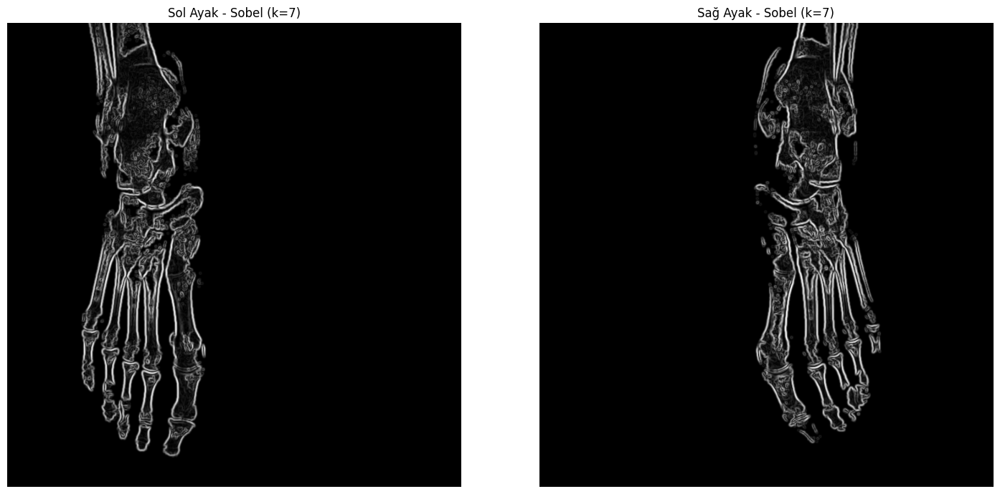


Sol Ayak Sobel (k=7) Ortalama: 9.935133034060684
Sağ Ayak Sobel (k=7) Ortalama: 9.528407402044099


In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import scipy.ndimage as ndi
from skimage import filters, feature, morphology
from skimage.util import img_as_ubyte
%matplotlib inline

def apply_clahe(image):
    """Zıtlık Dönüşümü (CLAHE)"""
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    clahe_image = clahe.apply(image)
    return clahe_image

def preprocess_image(image):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    enhanced = apply_clahe(gray)
    blurred = cv2.GaussianBlur(enhanced, (5, 5), 0)
    _, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    kernel = np.ones((5,5), np.uint8)
    closing = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)
    opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel)

    return opening, enhanced

def find_feet_contours(processed_image):
    contours, _ = cv2.findContours(processed_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:2]
    return contours

def separate_feet(image, processed, enhanced):
    contours = find_feet_contours(processed)

    if len(contours) == 2:
        mask1 = np.zeros_like(processed)
        mask2 = np.zeros_like(processed)

        cv2.drawContours(mask1, [contours[0]], -1, 255, -1)
        cv2.drawContours(mask2, [contours[1]], -1, 255, -1)

        foot1 = cv2.bitwise_and(enhanced, enhanced, mask=mask1)
        foot2 = cv2.bitwise_and(enhanced, enhanced, mask=mask2)

        M1 = cv2.moments(contours[0])
        M2 = cv2.moments(contours[1])

        if M1['m00'] != 0 and M2['m00'] != 0:
            cx1 = int(M1['m10']/M1['m00'])
            cx2 = int(M2['m10']/M2['m00'])

            if cx1 < cx2:
                left_foot = foot1
                right_foot = foot2
            else:
                left_foot = foot2
                right_foot = foot1

            return left_foot, right_foot

    height, width = enhanced.shape[:2]
    left_foot = enhanced[:, :width//2]
    right_foot = enhanced[:, width//2:]

    return left_foot, right_foot

def minmax_norm(image):
    """MinMax normalizasyon"""
    image_float = image.astype(float)
    min_val = np.min(image_float)
    max_val = np.max(image_float)
    if max_val != min_val:
        normalized = (image_float - min_val) / (max_val - min_val) * 255
    else:
        normalized = image_float
    return normalized.astype(np.uint8)

def optimal_image_enhancement(image):
    normalized = minmax_norm(image)
    gaussian = cv2.GaussianBlur(normalized, (3,3), 0.3)
    enhanced_base = cv2.convertScaleAbs(gaussian, alpha=1.05, beta=0)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_clahe = clahe.apply(enhanced_base)

    _, threshold = cv2.threshold(enhanced_clahe, 140, 255, cv2.THRESH_TOZERO)

    return threshold

def apply_sobel_k7(image):
    """Sadece Sobel k=7 uygula"""
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=7)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=7)
    sobel = np.sqrt(sobelx**2 + sobely**2)
    sobel = cv2.normalize(sobel, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    return sobel

# Ana işlem
# 1. Görüntüyü oku
image = cv2.imread('both_1.png', cv2.IMREAD_GRAYSCALE)

# 2. İlk ayırma işlemi
processed, enhanced = preprocess_image(image)
left_foot, right_foot = separate_feet(image, processed, enhanced)

# 3. Her ayak için optimal maskeleme
left_threshold = optimal_image_enhancement(left_foot)
right_threshold = optimal_image_enhancement(right_foot)

# 4. Sobel k=7 uygula
left_sobel = apply_sobel_k7(left_threshold)
right_sobel = apply_sobel_k7(right_threshold)

# Görselleştirme
plt.figure(figsize=(15, 7))

plt.subplot(121)
plt.imshow(left_sobel, cmap='gray')
plt.title('Sol Ayak - Sobel (k=7)')
plt.axis('off')

plt.subplot(122)
plt.imshow(right_sobel, cmap='gray')
plt.title('Sağ Ayak - Sobel (k=7)')
plt.axis('off')

plt.tight_layout()
plt.show()

# Ortalama değerleri yazdır
print("\nSol Ayak Sobel (k=7) Ortalama:", np.mean(left_sobel))
print("Sağ Ayak Sobel (k=7) Ortalama:", np.mean(right_sobel))